# Show samples on time domain

This notebook will show all the samples per dataset and class on frequency domain.

1. Calculate mean, minimum, and 75 percentil of samples
2. Calculate median, 25 percentil, and 75 percentil of samples
3. Plot the mean like line and 25/75 percentil like enveloping

In [1]:
from pathlib import Path  # For defining dataset Paths
import sys
sys.path.append("../../..")

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from umap import UMAP
#from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

# Librep imports
from librep.utils.dataset import PandasDatasetsIO          # For quick load train, test and validation CSVs
from librep.datasets.har.loaders import ExtraSensorySenseUnbalancedResampledView20HZ, UCIHARUnbalancedView, WISDMInterpolatedUnbalancedView, KuHarResampledView20HZ, MotionSenseResampledView20HZ, CHARMUnbalancedView

from librep.datasets.multimodal import PandasMultiModalDataset, TransformMultiModalDataset, WindowedTransform
from librep.transforms.fft import FFT
from librep.transforms. stats import StatsTransform
from librep.utils.workflow import SimpleTrainEvalWorkflow, MultiRunWorkflow
from librep.estimators import RandomForestClassifier, SVC, KNeighborsClassifier
from librep.metrics.report import ClassificationReport
from librep.transforms.resampler import SimpleResampler

2022-10-07 19:20:32.760823: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-07 19:20:32.760843: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Datasets to train the manifold

## Load ExtraSensory

In [3]:
# Load ExtraSensory, creating PandasMultiModalDatasets with the correct pre-defined windows
loader = ExtraSensorySenseUnbalancedResampledView20HZ("../../../data/views/ExtraSensory/unbalanced_20Hz_train-v1", download=False)
train_val_es = loader.load()[0]

In [4]:
train_val_es.data.iloc[:,:-8]

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-50,gyro-z-51,gyro-z-52,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59
0,0.008949,0.008045,0.013382,0.005547,0.009171,0.009484,0.002682,0.012434,0.005247,0.009579,...,-0.001655,-0.000548,-0.000017,0.000043,0.000608,-0.000553,-0.000506,-0.001651,-0.001260,-0.001771
1,0.007885,0.009641,0.007848,0.008434,0.008560,0.010423,0.005289,0.009952,0.006066,0.013453,...,0.000718,0.000260,-0.001939,-0.002040,0.000396,-0.000077,0.000641,0.000218,-0.001614,-0.001665
2,0.004486,0.007144,0.009683,0.009572,0.006842,0.007341,0.008749,0.009397,0.003069,0.007115,...,0.000231,-0.000082,-0.001318,-0.000512,-0.000142,0.000494,-0.000758,-0.000029,-0.000178,-0.000234
3,0.020244,0.002507,0.003476,0.034731,-0.002707,0.001861,0.015341,0.009896,0.011484,0.012472,...,0.000265,-0.001829,0.002546,0.017213,-0.010562,-0.013196,-0.010576,-0.022032,0.000801,0.011156
4,0.106152,0.132884,0.183170,0.291983,0.360944,0.410960,0.518888,0.558418,0.531926,0.401361,...,0.497501,0.807196,1.130580,0.952069,1.002923,0.757847,0.743950,0.508856,0.377331,0.000129
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25013,-1.834111,-0.634135,-1.367796,-1.563685,0.093902,3.411275,3.275478,1.867727,2.115405,1.492043,...,-0.290813,0.719708,0.847638,1.760178,1.281648,1.322466,1.628261,1.570378,0.900619,0.834545
25014,-1.671332,-0.954864,-1.008532,-0.448472,0.462539,-0.801835,0.874602,2.768817,-0.326576,1.012099,...,-0.053546,0.184549,-0.257309,-0.404991,0.124664,0.337072,0.998640,0.856102,0.151099,-0.885227
25015,0.859988,0.631427,0.620590,-0.064888,-0.269615,-0.140573,0.895613,1.237965,2.451095,2.157884,...,-0.320985,-0.161766,1.462780,2.268645,0.064582,0.192397,-2.679766,-3.254175,-2.500430,-2.721948
25016,0.269790,1.437568,-2.278815,6.520354,1.231790,-0.579296,0.234414,-1.820842,-1.080017,-0.593806,...,0.106716,-0.184656,-0.820349,-1.004691,-0.678159,0.374021,0.109051,1.239222,1.313676,-0.372590


In [5]:
train_val_es.data['standard activity code']

0        1
1        1
2        1
3        1
4        1
        ..
25013    2
25014    2
25015    2
25016    2
25017    2
Name: standard activity code, Length: 25018, dtype: int64

In [6]:
extrasensory_X = train_val_es.data.iloc[:,:-8]
extrasensory_Y = train_val_es.data['standard activity code']

tam = len(extrasensory_Y)
extrasensory_id_dataset = np.array(['E']*tam)

## Load UCI-HAR

In [7]:
# Load UCI-HAR, creating PandasMultiModalDatasets with the correct pre-defined windows
loader = UCIHARUnbalancedView("../../../data/views/UCI-HAR/unbalanced_20Hz_train_test-v1", download=False)
train_val_uci, test_uci = loader.load(concat_train_validation=True)

In [8]:
train_val_uci.data

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59,activity code,user,standard activity code
0,0.003565,0.008901,0.005801,0.004948,0.006308,0.005960,0.005928,0.006170,0.007250,0.006326,...,0.000240,-0.000519,-0.001399,0.001455,0.003015,0.010595,0.003470,5,1,1
1,0.001266,-0.001774,0.001172,0.000990,-0.000784,-0.001122,0.002905,0.002715,-0.000973,0.000815,...,-0.000780,-0.005341,-0.009295,-0.011561,-0.009854,-0.003153,0.000108,5,1,1
2,0.000546,-0.000908,-0.001513,-0.001802,0.000595,0.001365,-0.001567,-0.000779,-0.000577,-0.000263,...,-0.000859,0.001881,0.003989,0.002610,0.000582,0.010218,0.021120,5,1,1
3,0.003104,0.001146,-0.004158,0.001729,-0.000769,0.001305,0.003918,-0.002209,-0.000397,-0.001232,...,-0.002719,0.003975,0.001041,-0.004906,0.000427,-0.000771,-0.013023,5,1,1
4,-0.001820,0.000755,0.001618,0.002065,-0.000736,-0.001323,0.002889,-0.001119,0.001074,-0.003958,...,0.002172,0.000114,0.000322,-0.001916,0.001534,0.002732,0.007108,5,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2454,0.013458,-0.070288,0.069952,0.026208,0.137807,0.375901,0.596737,0.329611,0.043722,-0.056924,...,-0.218047,-0.547776,-0.612564,-0.837015,-0.729588,-0.472352,-0.211776,2,30,3
2455,0.140879,0.144345,0.464152,0.456810,0.267120,-0.026908,-0.131830,-0.147693,-0.364213,-0.355118,...,-0.476739,-0.819931,-0.750365,-0.630116,-0.337958,0.013349,0.153647,2,30,3
2456,0.132817,0.460201,0.530693,0.298639,0.018089,-0.059733,-0.115499,-0.287280,-0.350470,-0.343768,...,0.120246,0.357961,0.001281,-0.054251,0.315337,0.080816,0.326850,2,30,3
2457,-0.111181,-0.336622,-0.329962,-0.202659,-0.255559,-0.228172,-0.063806,0.102427,0.427488,0.676010,...,-0.229515,0.025977,0.066758,0.067897,0.115644,0.092375,0.298367,2,30,3


In [9]:
train_val_uci.data.iloc[:,:-3]

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-50,gyro-z-51,gyro-z-52,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59
0,0.003565,0.008901,0.005801,0.004948,0.006308,0.005960,0.005928,0.006170,0.007250,0.006326,...,-0.002097,-0.001315,0.002887,0.000240,-0.000519,-0.001399,0.001455,0.003015,0.010595,0.003470
1,0.001266,-0.001774,0.001172,0.000990,-0.000784,-0.001122,0.002905,0.002715,-0.000973,0.000815,...,-0.003287,0.002715,0.002455,-0.000780,-0.005341,-0.009295,-0.011561,-0.009854,-0.003153,0.000108
2,0.000546,-0.000908,-0.001513,-0.001802,0.000595,0.001365,-0.001567,-0.000779,-0.000577,-0.000263,...,0.003624,0.005612,0.006521,-0.000859,0.001881,0.003989,0.002610,0.000582,0.010218,0.021120
3,0.003104,0.001146,-0.004158,0.001729,-0.000769,0.001305,0.003918,-0.002209,-0.000397,-0.001232,...,-0.007704,-0.005069,0.005707,-0.002719,0.003975,0.001041,-0.004906,0.000427,-0.000771,-0.013023
4,-0.001820,0.000755,0.001618,0.002065,-0.000736,-0.001323,0.002889,-0.001119,0.001074,-0.003958,...,0.006845,0.005905,0.006080,0.002172,0.000114,0.000322,-0.001916,0.001534,0.002732,0.007108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2454,0.013458,-0.070288,0.069952,0.026208,0.137807,0.375901,0.596737,0.329611,0.043722,-0.056924,...,0.775176,0.479487,0.243283,-0.218047,-0.547776,-0.612564,-0.837015,-0.729588,-0.472352,-0.211776
2455,0.140879,0.144345,0.464152,0.456810,0.267120,-0.026908,-0.131830,-0.147693,-0.364213,-0.355118,...,0.258731,-0.231263,-0.481620,-0.476739,-0.819931,-0.750365,-0.630116,-0.337958,0.013349,0.153647
2456,0.132817,0.460201,0.530693,0.298639,0.018089,-0.059733,-0.115499,-0.287280,-0.350470,-0.343768,...,-0.457300,-0.472327,-0.177299,0.120246,0.357961,0.001281,-0.054251,0.315337,0.080816,0.326850
2457,-0.111181,-0.336622,-0.329962,-0.202659,-0.255559,-0.228172,-0.063806,0.102427,0.427488,0.676010,...,0.098396,0.205140,0.012599,-0.229515,0.025977,0.066758,0.067897,0.115644,0.092375,0.298367


In [10]:
uci_X = train_val_uci.data.iloc[:,:-3]
uci_Y = train_val_uci.data['standard activity code']

tam = len(uci_Y)
uci_id_dataset = np.array(['U']*tam)

## Load WISDM

In [11]:
# Load WISDM and create PandasMultiModalDatasets with the correct pre-defined windows
loader = WISDMInterpolatedUnbalancedView("../../../data/views/WISDM/unbalanced_20Hz_train_test-v1", download=False)
train_val_wisdm, test_wisdm = loader.load(concat_train_validation=True)
train_val_wisdm.data

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59,activity code,user,standard activity code
0,-0.364761,-0.900995,1.988477,0.504245,-2.074267,-4.365631,-0.503460,1.585056,-0.192807,-1.778517,...,0.021654,-0.008257,-0.392786,-0.329143,-0.074698,-0.027220,0.314905,0,1600,2
1,0.081002,-0.059554,0.429260,1.072248,-2.011736,-4.792650,-2.087036,0.663866,0.317017,-1.504834,...,0.345166,0.294343,-0.417068,-0.172208,0.067521,0.406141,0.615971,0,1600,2
2,0.192588,-0.855499,-1.242746,0.316417,-1.833108,-4.946311,1.429507,1.555702,-1.230934,-2.758278,...,0.341863,0.039910,-0.253467,-0.607339,-0.102324,0.100644,0.608968,0,1600,2
3,1.506239,-1.887573,-0.375515,0.282729,-2.745547,-5.598461,-1.923976,1.519264,0.538521,-2.826598,...,0.408067,0.268658,-0.341150,-0.359142,-0.065309,-0.015974,0.365056,0,1600,2
4,-0.494237,-0.791543,0.976555,1.730751,-4.135104,-7.033570,-3.470397,-1.347896,0.434743,0.326745,...,-0.459501,0.421399,-0.182202,-0.406128,-0.590792,-0.174049,0.307581,0,1600,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10818,-0.705972,-0.726914,-0.808348,-0.727646,-0.519297,-0.706294,-0.778460,-0.935760,-0.656630,-0.765051,...,0.015264,0.003391,-0.007575,0.000763,0.015584,-0.014311,-0.016027,4,1635,1
10819,-0.608502,-0.795883,-0.552300,-0.851302,-0.894535,-0.706040,-0.784716,-0.855779,-0.704870,-0.683281,...,-0.003144,-0.002943,0.005729,-0.010290,-0.006023,-0.006458,-0.001189,4,1635,1
10820,-0.777215,-0.714181,-0.765897,-0.765035,-0.697754,-0.852415,-0.749396,-0.637518,-0.757676,-0.702906,...,-0.001254,0.006774,-0.001247,0.001032,0.006439,0.005181,0.011468,4,1635,1
10821,-1.073461,-0.614644,-0.764390,-0.546810,-0.874834,-0.619953,-0.698473,-0.924804,-0.704255,-0.736017,...,0.004119,0.000570,-0.035448,-0.028324,0.004960,0.002800,-0.004581,4,1635,1


In [12]:
train_val_wisdm.data.iloc[:,:-3]

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-50,gyro-z-51,gyro-z-52,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59
0,-0.364761,-0.900995,1.988477,0.504245,-2.074267,-4.365631,-0.503460,1.585056,-0.192807,-1.778517,...,-0.400735,-0.302704,-0.193205,0.021654,-0.008257,-0.392786,-0.329143,-0.074698,-0.027220,0.314905
1,0.081002,-0.059554,0.429260,1.072248,-2.011736,-4.792650,-2.087036,0.663866,0.317017,-1.504834,...,-0.425415,0.143507,-0.229825,0.345166,0.294343,-0.417068,-0.172208,0.067521,0.406141,0.615971
2,0.192588,-0.855499,-1.242746,0.316417,-1.833108,-4.946311,1.429507,1.555702,-1.230934,-2.758278,...,-0.369517,-0.031353,-0.265816,0.341863,0.039910,-0.253467,-0.607339,-0.102324,0.100644,0.608968
3,1.506239,-1.887573,-0.375515,0.282729,-2.745547,-5.598461,-1.923976,1.519264,0.538521,-2.826598,...,-0.667743,-0.639873,-0.394629,0.408067,0.268658,-0.341150,-0.359142,-0.065309,-0.015974,0.365056
4,-0.494237,-0.791543,0.976555,1.730751,-4.135104,-7.033570,-3.470397,-1.347896,0.434743,0.326745,...,-0.832488,0.009191,0.124568,-0.459501,0.421399,-0.182202,-0.406128,-0.590792,-0.174049,0.307581
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10818,-0.705972,-0.726914,-0.808348,-0.727646,-0.519297,-0.706294,-0.778460,-0.935760,-0.656630,-0.765051,...,-0.002618,-0.014469,0.011366,0.015264,0.003391,-0.007575,0.000763,0.015584,-0.014311,-0.016027
10819,-0.608502,-0.795883,-0.552300,-0.851302,-0.894535,-0.706040,-0.784716,-0.855779,-0.704870,-0.683281,...,0.003346,-0.002748,0.002332,-0.003144,-0.002943,0.005729,-0.010290,-0.006023,-0.006458,-0.001189
10820,-0.777215,-0.714181,-0.765897,-0.765035,-0.697754,-0.852415,-0.749396,-0.637518,-0.757676,-0.702906,...,0.007118,0.003037,0.001493,-0.001254,0.006774,-0.001247,0.001032,0.006439,0.005181,0.011468
10821,-1.073461,-0.614644,-0.764390,-0.546810,-0.874834,-0.619953,-0.698473,-0.924804,-0.704255,-0.736017,...,-0.023223,-0.055126,-0.045073,0.004119,0.000570,-0.035448,-0.028324,0.004960,0.002800,-0.004581


In [13]:
wisdm_X = np.array(train_val_wisdm.data.iloc[:,:-3])
wisdm_Y = np.array(train_val_wisdm.data['standard activity code'])

tam = len(wisdm_Y)
wisdm_id_dataset = np.array(['W']*tam)

## Load KuHar

In [14]:
loader = KuHarResampledView20HZ("../../../../data/views/KuHar/balanced_20Hz_motionsense_equivalent-v1")

In [15]:
train_val_kh, test_kh = loader.load(concat_train_validation=True)

In [16]:
train_val_kh.data

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,accel-start-time,gyro-start-time,accel-end-time,gyro-end-time,activity code,length,serial,index,user,standard activity code
0,-1.042828,7.069610,3.455672,0.858443,-13.806092,-5.950121,-0.608514,2.916913,4.881929,8.610287,...,9.159,9.160,12.199,12.201,0,300,23,900,1101,4
1,-2.437900,-2.628449,-2.166861,-3.854701,0.527599,11.567884,6.840191,-2.435600,-3.324599,-0.796095,...,9.167,9.166,12.211,12.208,0,300,43,900,1101,4
2,-0.664337,0.483465,3.090238,3.559119,3.888318,1.113559,3.656104,4.866379,0.073993,-14.136122,...,15.262,15.263,18.298,18.299,0,300,24,1500,1101,4
3,-2.269775,-3.209509,-2.508545,-2.923223,-1.269270,7.864898,7.683389,2.325797,-3.086381,-3.675483,...,33.572,33.583,36.615,36.626,0,300,41,3300,1101,4
4,-0.487718,0.226401,0.609332,1.490074,-0.295221,-1.111420,-0.627382,0.028419,-0.823724,-0.469242,...,0.008,0.007,3.047,3.048,0,300,30,0,1101,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3109,-16.047706,-10.232285,-1.393564,22.982999,13.706479,7.789294,-4.720361,-15.633462,-8.674399,-11.634360,...,3.000,3.007,6.000,6.008,5,300,8,300,1042,5
3110,1.911780,-6.910686,1.625745,12.975344,12.066726,5.300426,-10.848059,-14.261385,-3.988711,-4.235381,...,5.927,5.927,8.880,8.879,5,300,2,600,1046,5
3111,3.927244,19.311380,0.403673,-14.236972,-10.454149,-4.218160,-4.307016,17.655546,12.570647,7.031853,...,2.966,2.966,5.920,5.919,5,300,5,300,1046,5
3112,-7.208894,-11.734247,13.677432,21.571222,3.191808,2.215446,-12.397302,-13.905091,-8.743007,11.580156,...,3.003,3.001,5.993,5.991,5,300,6,300,1042,5


In [17]:
train_val_kh.data['standard activity code'].unique()

array([4, 3, 0, 1, 2, 5])

In [18]:
train_val_kh.data.iloc[:,:-10]

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-50,gyro-z-51,gyro-z-52,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59
0,-1.042828,7.069610,3.455672,0.858443,-13.806092,-5.950121,-0.608514,2.916913,4.881929,8.610287,...,-0.472805,0.343294,0.260441,-0.082865,0.299246,0.215924,0.322555,0.508903,-0.113054,-0.380190
1,-2.437900,-2.628449,-2.166861,-3.854701,0.527599,11.567884,6.840191,-2.435600,-3.324599,-0.796095,...,0.267483,-0.713088,0.337778,-0.016247,-0.170998,0.067450,-0.153206,-0.094137,-0.238300,0.377260
2,-0.664337,0.483465,3.090238,3.559119,3.888318,1.113559,3.656104,4.866379,0.073993,-14.136122,...,0.371043,0.478258,-0.547497,-0.010739,0.005712,-0.275884,0.048012,0.288451,0.118925,0.288595
3,-2.269775,-3.209509,-2.508545,-2.923223,-1.269270,7.864898,7.683389,2.325797,-3.086381,-3.675483,...,0.011855,0.110627,0.131676,0.085040,0.143971,0.129493,0.189543,0.057577,-0.121568,-0.037776
4,-0.487718,0.226401,0.609332,1.490074,-0.295221,-1.111420,-0.627382,0.028419,-0.823724,-0.469242,...,-0.224966,0.039142,-0.232840,0.027406,-0.153478,-0.047371,0.020793,0.186724,0.132858,0.318369
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3109,-16.047706,-10.232285,-1.393564,22.982999,13.706479,7.789294,-4.720361,-15.633462,-8.674399,-11.634360,...,-0.110008,1.042713,-1.098746,-0.203113,0.062445,0.489244,-0.153889,-0.825626,1.408920,-0.048886
3110,1.911780,-6.910686,1.625745,12.975344,12.066726,5.300426,-10.848059,-14.261385,-3.988711,-4.235381,...,-0.255121,0.348626,1.796430,-0.504031,-0.271142,-0.141103,-0.355877,0.450288,-0.041400,-0.955341
3111,3.927244,19.311380,0.403673,-14.236972,-10.454149,-4.218160,-4.307016,17.655546,12.570647,7.031853,...,-0.825732,-0.816069,-0.332729,-0.034519,0.551195,-0.635052,-1.169866,0.926100,1.036354,-0.090644
3112,-7.208894,-11.734247,13.677432,21.571222,3.191808,2.215446,-12.397302,-13.905091,-8.743007,11.580156,...,0.261531,1.145154,-0.355114,1.075646,-1.983060,-1.722173,2.191585,-0.139135,0.742427,0.765420


In [19]:
kuhar_X = np.array(train_val_kh.data.iloc[:,:-10])
kuhar_Y = np.array(train_val_kh.data['standard activity code'])
tam = len(kuhar_Y)
kuhar_id_dataset = np.array(['K']*tam)

## Load MotionSense

In [20]:
loader = MotionSenseResampledView20HZ("../../../../data/views/MotionSense/balanced_20Hz-v1")

In [21]:
# Motionsense dataframe
train_val_motion, test_motion = loader.load(concat_train_validation=True)
train_val_motion.data

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59,activity code,length,trial_code,index,user,standard activity code
0,-0.101581,-0.221355,-0.234016,-0.264552,-0.200991,-0.208962,-0.308408,0.089943,-0.382516,-0.077553,...,-0.171130,0.292608,0.932535,0.782147,0,150,1,150,11,4
1,-0.082527,0.201136,-0.017408,0.120404,-0.179599,-0.013960,-0.014233,0.253264,0.684288,0.154172,...,0.241819,0.718420,0.336507,0.936563,0,150,1,900,12,4
2,0.108323,-0.045941,0.017410,0.010881,0.019035,-0.157225,0.016889,-0.076276,0.149599,0.016328,...,0.732298,0.667477,-0.025386,-0.037093,0,150,1,1050,21,4
3,-0.370755,-0.495850,0.205895,0.455012,0.113117,-0.327512,0.111760,0.001935,-0.844532,0.440440,...,0.037076,-0.993926,-0.182277,0.317828,0,150,2,150,17,4
4,-0.005683,0.452370,0.028475,0.402016,0.168378,0.353346,0.182684,0.042545,0.001530,-0.009679,...,0.496173,1.265226,1.502311,0.857408,0,150,11,450,21,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4015,-0.007693,0.374393,-0.103716,0.514280,0.141910,0.196481,0.390237,-1.349047,-0.513315,0.040985,...,-0.589413,-1.091889,1.141263,-0.552978,5,150,9,3300,4,5
4016,-0.785497,-0.465941,1.356811,-0.254648,-1.731042,-0.297563,1.190248,-1.193936,0.560628,0.325113,...,2.611230,1.658511,1.304156,-2.120086,5,150,9,150,20,5
4017,0.892239,0.629815,0.395018,-0.061029,0.418810,0.094484,0.048136,-1.074050,0.657432,0.022222,...,1.016603,-1.277840,-2.122599,-1.689117,5,150,9,2550,7,5
4018,-0.136312,-0.461621,-0.561228,-0.670517,0.174832,-0.068340,-0.384419,-0.207647,0.030618,-0.006123,...,1.358415,1.432210,0.481120,-2.242066,5,150,9,2250,7,5


In [22]:
train_val_motion.data.iloc[:,:-6]

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-50,gyro-z-51,gyro-z-52,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59
0,-0.101581,-0.221355,-0.234016,-0.264552,-0.200991,-0.208962,-0.308408,0.089943,-0.382516,-0.077553,...,0.338630,0.630162,0.010132,-0.357627,-0.270421,-0.099006,-0.171130,0.292608,0.932535,0.782147
1,-0.082527,0.201136,-0.017408,0.120404,-0.179599,-0.013960,-0.014233,0.253264,0.684288,0.154172,...,-0.188645,0.175246,-0.369358,0.338468,-0.711659,-0.838042,0.241819,0.718420,0.336507,0.936563
2,0.108323,-0.045941,0.017410,0.010881,0.019035,-0.157225,0.016889,-0.076276,0.149599,0.016328,...,0.105371,0.025860,1.168944,0.831773,-0.490816,0.497304,0.732298,0.667477,-0.025386,-0.037093
3,-0.370755,-0.495850,0.205895,0.455012,0.113117,-0.327512,0.111760,0.001935,-0.844532,0.440440,...,-2.477212,-1.612381,-0.416034,0.802364,0.116252,0.919908,0.037076,-0.993926,-0.182277,0.317828
4,-0.005683,0.452370,0.028475,0.402016,0.168378,0.353346,0.182684,0.042545,0.001530,-0.009679,...,-0.533618,-0.931536,-0.890335,-0.515152,-0.552368,-0.060734,0.496173,1.265226,1.502311,0.857408
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4015,-0.007693,0.374393,-0.103716,0.514280,0.141910,0.196481,0.390237,-1.349047,-0.513315,0.040985,...,0.332628,-0.564182,1.271037,2.880865,2.318440,0.053538,-0.589413,-1.091889,1.141263,-0.552978
4016,-0.785497,-0.465941,1.356811,-0.254648,-1.731042,-0.297563,1.190248,-1.193936,0.560628,0.325113,...,-2.720648,-1.525806,-0.443669,0.836655,1.793170,2.214804,2.611230,1.658511,1.304156,-2.120086
4017,0.892239,0.629815,0.395018,-0.061029,0.418810,0.094484,0.048136,-1.074050,0.657432,0.022222,...,1.203391,0.940672,1.160005,0.241466,-1.654988,-0.728725,1.016603,-1.277840,-2.122599,-1.689117
4018,-0.136312,-0.461621,-0.561228,-0.670517,0.174832,-0.068340,-0.384419,-0.207647,0.030618,-0.006123,...,-0.281189,-0.078258,0.658548,1.646081,1.596760,1.686676,1.358415,1.432210,0.481120,-2.242066


In [23]:
motion_X = np.array(train_val_motion.data.iloc[:,:-6])
motion_Y = np.array(train_val_motion.data['standard activity code'])
tam = len(motion_Y)
motion_id_dataset = np.array(['M']*tam)

## Load CHARM

In [24]:
# Load CHARM, creating PandasMultiModalDatasets with the correct pre-defined windows
loader = CHARMUnbalancedView("../../../data/views/CHARM/balanced_20Hz_train_test-v1", download=False)
train_val_charm, test_charm = loader.load(concat_train_validation=True)

In [25]:
train_val_charm.data.iloc[:,1:-3]

,accel-x-0,accel-x-1,accel-x-2,accel-x-3,accel-x-4,accel-x-5,accel-x-6,accel-x-7,accel-x-8,accel-x-9,...,gyro-z-50,gyro-z-51,gyro-z-52,gyro-z-53,gyro-z-54,gyro-z-55,gyro-z-56,gyro-z-57,gyro-z-58,gyro-z-59
0,-0.316044,-2.499959,-0.616105,0.353358,-0.824398,-0.810047,-1.138340,-1.589111,-1.370696,-0.703873,...,5.141144,5.120107,5.126820,5.147284,5.167496,5.180790,5.222275,5.303915,5.373075,5.411260
1,-0.050466,0.074350,0.097396,0.084905,0.112700,0.134203,0.110953,0.088282,0.177306,0.145449,...,5.112808,5.018489,5.044690,5.111729,5.150032,5.159996,5.156902,5.147285,5.131298,5.108950
2,0.270301,0.028054,0.146652,0.376342,0.164298,0.253816,0.245170,0.202514,0.265768,0.320114,...,5.052559,5.152483,5.288892,5.437164,5.572677,5.670806,5.707042,5.675314,5.608472,5.544296
3,-0.683588,-1.033685,-1.154929,-0.492721,0.061972,0.130619,0.385515,0.393008,0.082072,-0.764478,...,5.325069,5.343148,5.360652,5.380427,5.405318,5.438172,5.481835,5.538151,5.597009,5.640450
4,-0.185709,-0.083570,-0.230019,-0.157817,-0.349459,-0.400257,-0.079761,-0.236021,-0.043397,0.095293,...,4.639179,4.496824,4.510063,4.722800,4.969438,5.028447,4.880812,4.689925,4.580247,4.548837
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
730,-0.358002,-0.157281,-0.237719,-0.506597,-0.652816,-0.756904,-0.848554,-0.857909,-0.675477,-0.601827,...,9.722618,9.709999,9.668431,9.600750,9.509793,9.398394,9.269391,9.125620,8.969915,8.805115
731,-0.577685,-0.746320,-0.771814,-0.852250,-0.770985,-0.792406,-0.938076,-0.706645,-0.654285,-0.635534,...,5.835391,5.887688,5.942822,6.000710,6.061267,6.124409,6.190054,6.258116,6.328513,6.401161
732,0.623657,0.911399,0.517688,-0.015968,-0.219780,-0.215724,-0.340050,-0.973663,-1.091267,-0.706216,...,11.104447,11.089956,11.047596,10.979259,10.886837,10.772225,10.637316,10.484001,10.314175,10.129730
733,-0.367026,-0.345516,-0.047627,0.259660,0.393635,0.374339,0.522283,0.734257,1.208773,1.106555,...,7.235746,7.092349,6.951867,6.818254,6.695461,6.587442,6.498150,6.431536,6.391555,6.382158


In [26]:
charm_X = np.array(train_val_charm.data.iloc[:,1:-3])
charm_Y = np.array(train_val_charm.data['standard activity code'])
tam = len(charm_Y)
charm_id_dataset = np.array(['C']*tam)

# Prepare the data

In [27]:
columns = list(train_val_charm.data.iloc[:,1:-3].columns)

In [28]:
data_X = np.concatenate([charm_X, motion_X, kuhar_X, wisdm_X, uci_X, extrasensory_X])
data_Y = np.concatenate([charm_Y, motion_Y, kuhar_Y, wisdm_Y, uci_Y, extrasensory_Y])
data_id_dataset = np.concatenate([charm_id_dataset, motion_id_dataset, kuhar_id_dataset, wisdm_id_dataset, 
                                  uci_id_dataset, extrasensory_id_dataset])

In [29]:
data = pd.DataFrame(data_X, columns=columns)
data['standard activity code'] = data_Y
data['Id Dataset'] = data_id_dataset

In [30]:
classes_names = {
    0: "Sit",
    1: "Stand", 
    2: "Walk",
    3: "Upstairs",
    4: "Downstairs",
    5: "Run / Jogging",
    6: "stair up and down"
}

In [31]:
# def plot(data_fft, classes_names):
def max_norm(v):
    norm = max(np.abs(v))
    return norm

def plot_mean(data_fft, dataset, classes_names, datasets):
    
    classes = np.unique(data_fft.y)
    time_axi = np.linspace(0,3,60)

    samples_per_activity = {i:[] for i in range(7)}
    mean_samples_per_activity = {i:[] for i in range(7)}
    max_samples = {i:[] for i in range(7)}
    min_samples = {i:[] for i in range(7)}
    
    percentil_5_sample = {i:[] for i in range(7)}
    percentil_95_sample = {i:[] for i in range(7)}

    for sample, label in data_fft:
        sam = np.reshape(sample, (6,60))

        new_sample = []
        for sensor_axi in sam:
            # norm = max_norm(sensor_axi)
            norm = 1.
            new_sample.append(sensor_axi / norm)

        new_sample = np.array(new_sample)
        samples_per_activity[label].append(new_sample)

    for i in classes:
        mean_samples_per_activity[i] = np.reshape(np.mean(samples_per_activity[i], axis=0), (6,60))
        min_samples[i] = np.reshape(np.min(samples_per_activity[i], axis=0), 
                                            (6,60))
        max_samples[i] = np.reshape(np.max(samples_per_activity[i], axis=0), 
                                            (6,60))

    sensors = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']
    num_data, tam_data = 6, 60

    for classe in classes:
        fig, axs = plt.subplots(nrows=num_data, ncols=1, figsize=(7,7), sharey=False)
        aux =[]
        axs[0].set_title('Envelope da média das séries temporais da classe {} - Dataset: {}'.format(classes_names[classe], 
                                                                                                         datasets[dataset]))
        for j in range(num_data):
            axs[j].set_ylabel("Magnitude")
            axs[j].set_xlabel("Time (seg.) - Sensor: {}".format(sensors[j]))
            axs[j].set_xlim(0,3)
            axs[j].plot(time_axi, mean_samples_per_activity[classe][j], color='C1', label="Mean")
            axs[j].plot(time_axi, min_samples[classe][j], color='C4', label="Min")
            axs[j].plot(time_axi, max_samples[classe][j], color='C4', label="Max")
            axs[j].fill_between(time_axi, min_samples[classe][j], 
                                max_samples[classe][j], alpha=0.3)
            axs[j].grid()

            fig.tight_layout() 
            plt.legend()

        plt.show()
        
        
def plot_median(data_fft, dataset, classes_names, datasets):
    
    classes = np.unique(data_fft.y)
    time_axi = np.linspace(0,3,60)

    samples_per_activity = {i:[] for i in range(7)}
    median_samples_per_activity = {i:[] for i in range(7)}
    
    percentil_25_sample = {i:[] for i in range(7)}
    percentil_75_sample = {i:[] for i in range(7)}

    for sample, label in data_fft:
        sam = np.reshape(sample, (6,60))

        new_sample = []
        for sensor_axi in sam:
            # norm = max_norm(sensor_axi)
            norm = 1.
            new_sample.append(sensor_axi / norm)

        new_sample = np.array(new_sample)
        samples_per_activity[label].append(new_sample)

    for i in classes:
        median_samples_per_activity[i] = np.reshape(np.median(samples_per_activity[i], axis=0), (6,60))
        percentil_25_sample[i] = np.reshape(np.percentile(samples_per_activity[i], 25, axis=0), 
                                            (6,60))
        percentil_75_sample[i] = np.reshape(np.percentile(samples_per_activity[i], 75, axis=0), 
                                            (6,60))

    sensors = ['acc_x', 'acc_y', 'acc_z', 'gyr_x', 'gyr_y', 'gyr_z']
    num_data, tam_data = 6, 60

    for classe in classes:
        fig, axs = plt.subplots(nrows=num_data, ncols=1, figsize=(7, 7), sharey=False)
        aux =[]
        axs[0].set_title('Envelope da mediana das séries temporais da classe {} - Dataset: {}'.format(classes_names[classe], 
                                                                                                         datasets[dataset]))
        for j in range(num_data):
            axs[j].set_ylabel("Amplitude")
            axs[j].set_xlabel("Time (seg.) - Sensor: {}".format(sensors[j]))
            axs[j].set_xlim(0,3)
            axs[j].plot(time_axi, median_samples_per_activity[classe][j], color='C1', label="Median")
            axs[j].plot(time_axi, percentil_25_sample[classe][j], color='C4', label="25 percentil")
            axs[j].plot(time_axi, percentil_75_sample[classe][j], color='C4', label="75 percentil")
            axs[j].fill_between(time_axi, percentil_25_sample[classe][j], 
                                percentil_75_sample[classe][j], alpha=0.3)
            axs[j].grid()

            fig.tight_layout() 
            plt.legend()

        plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


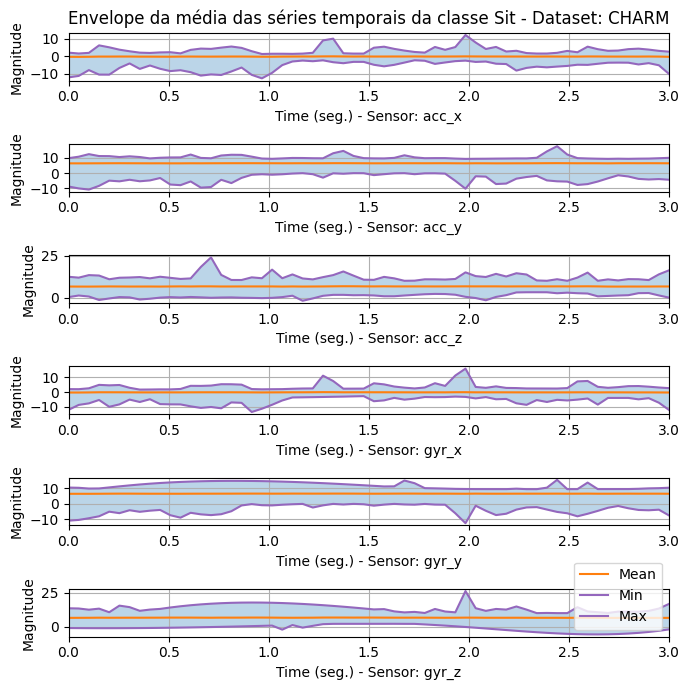

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


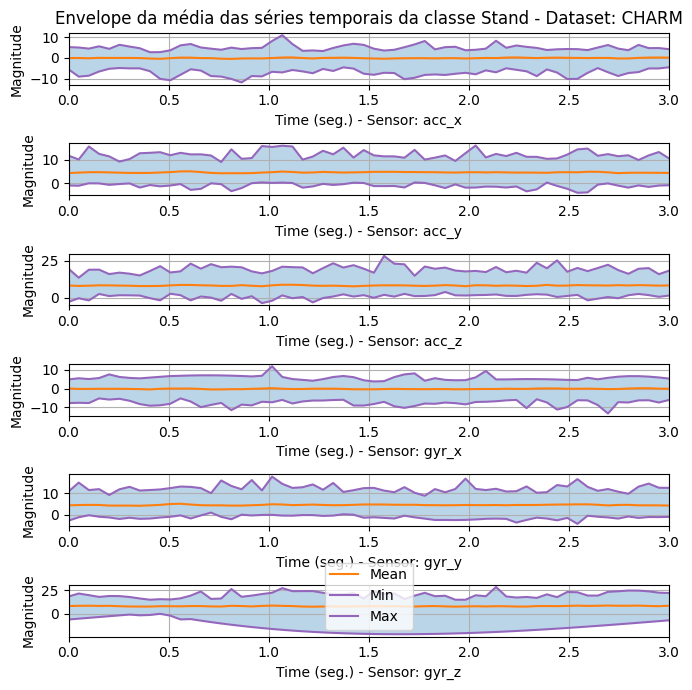

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


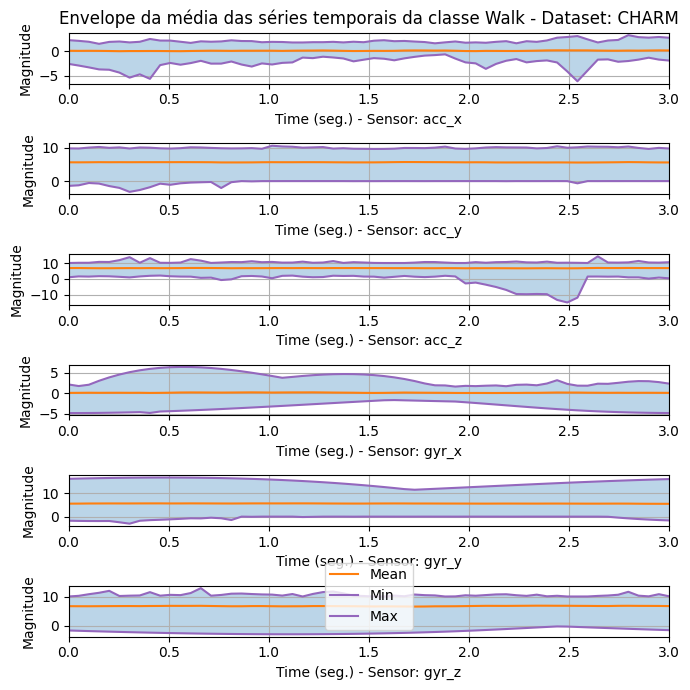

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


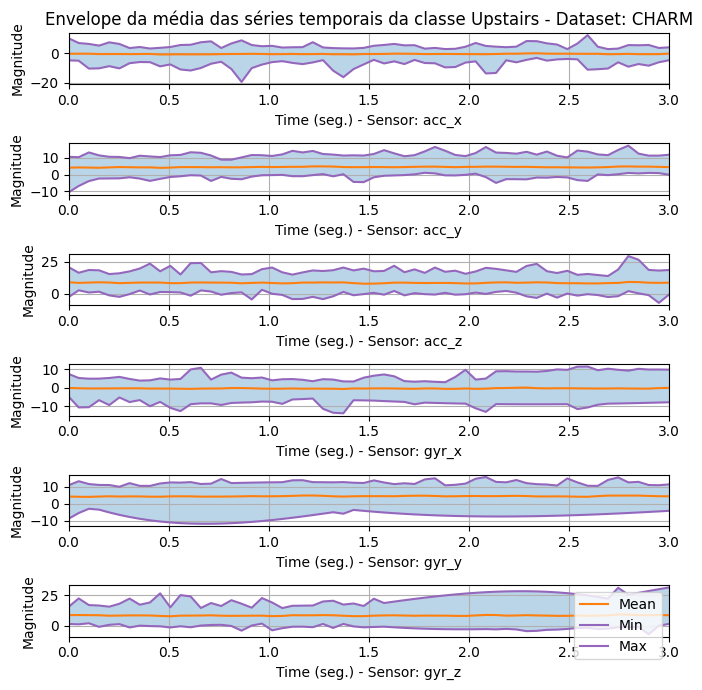

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


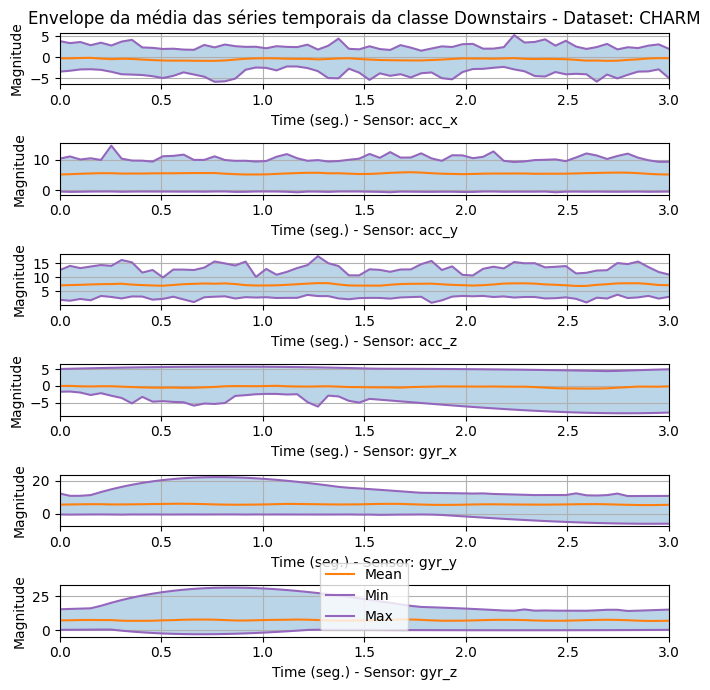

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


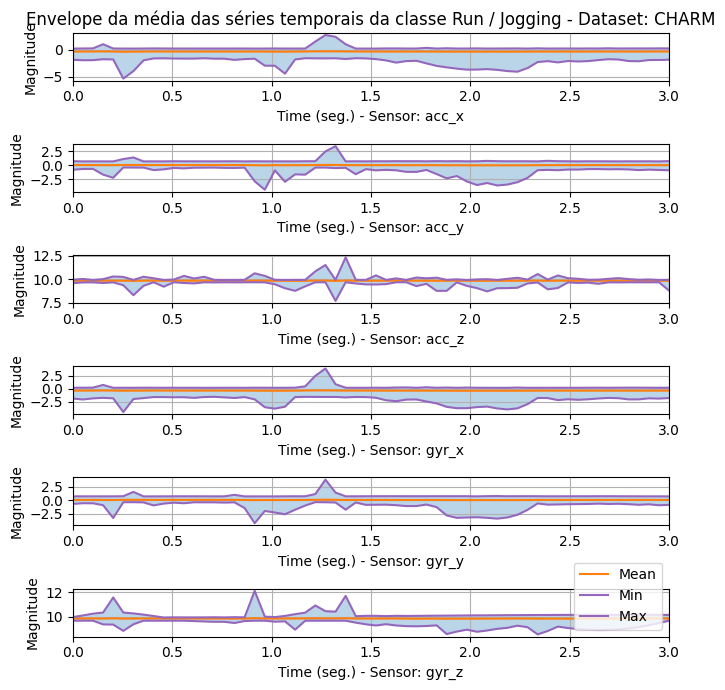

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


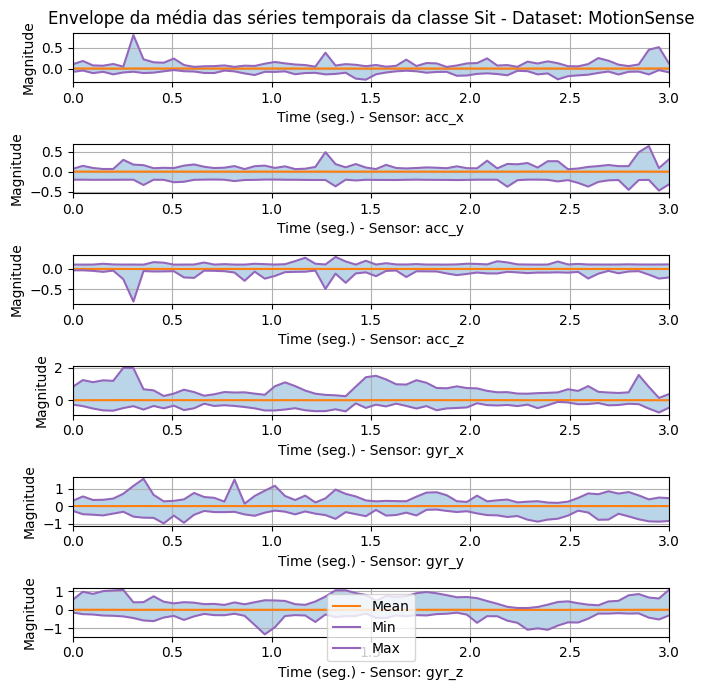

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


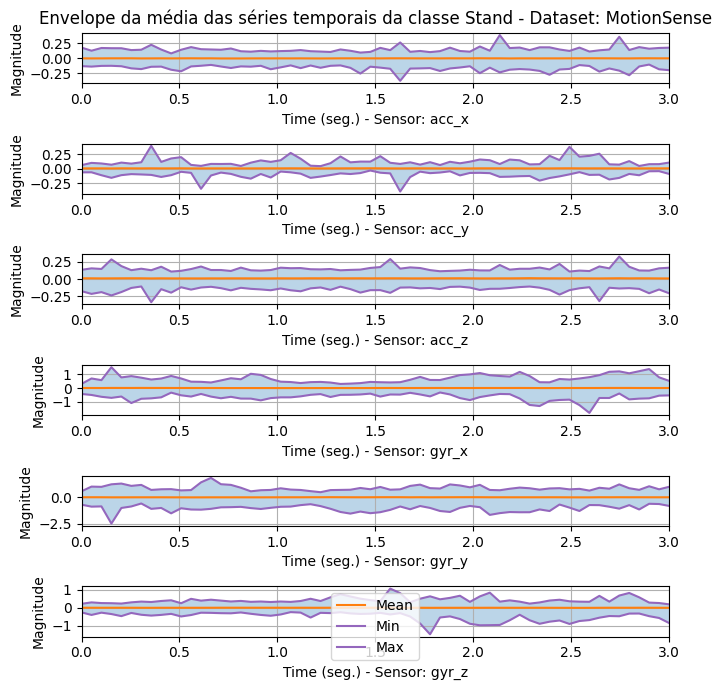

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


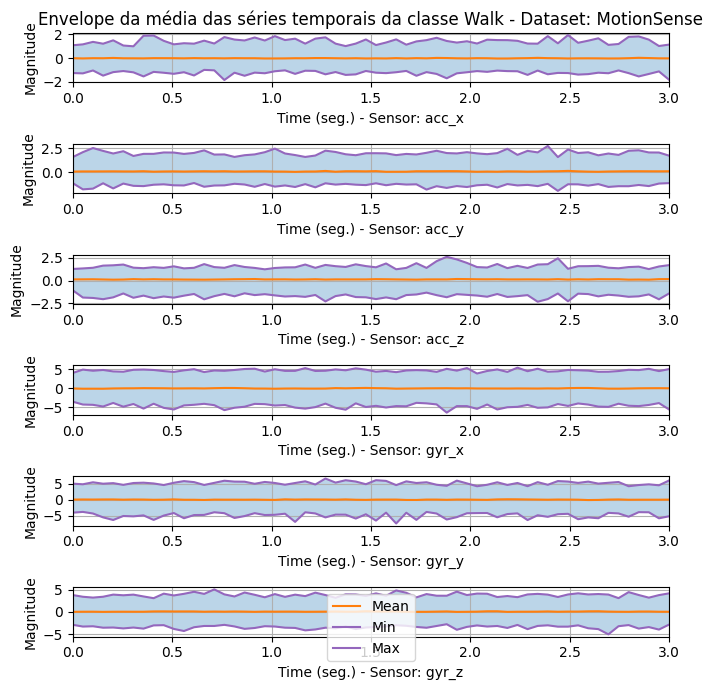

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


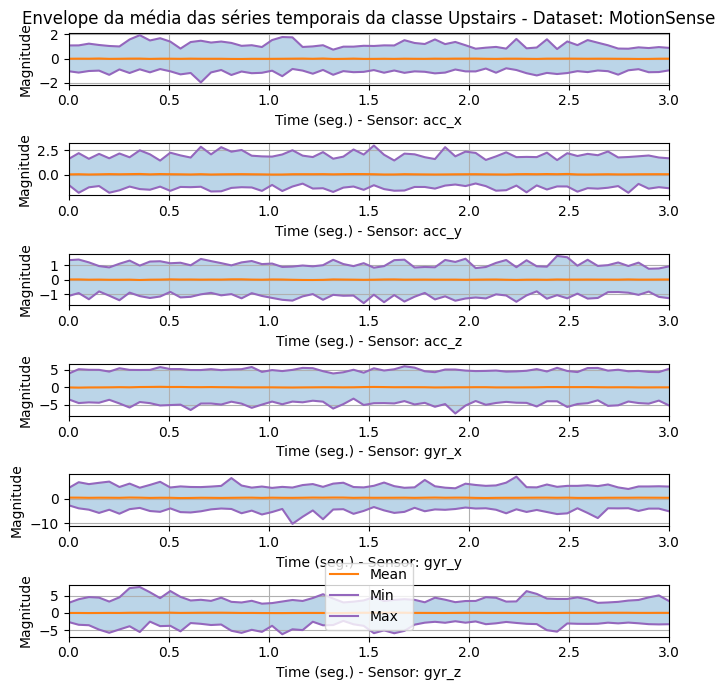

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


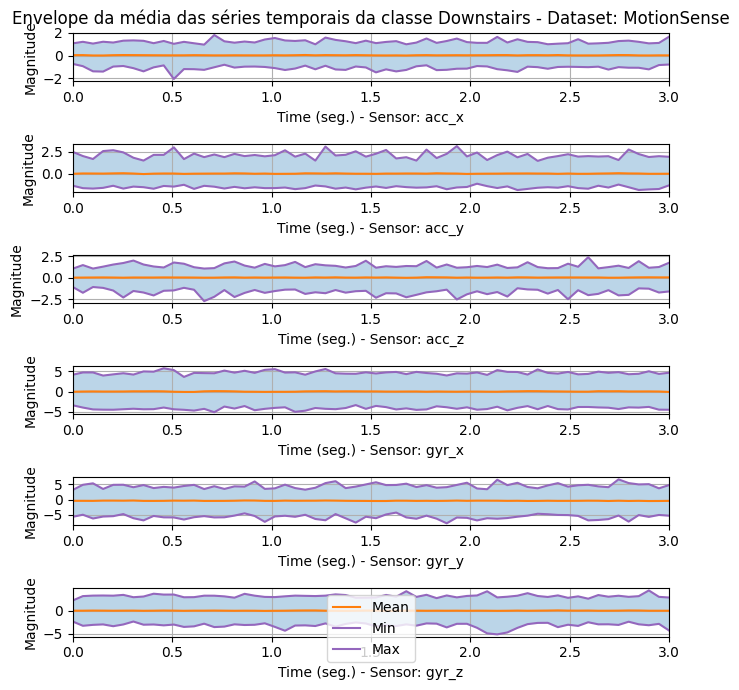

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


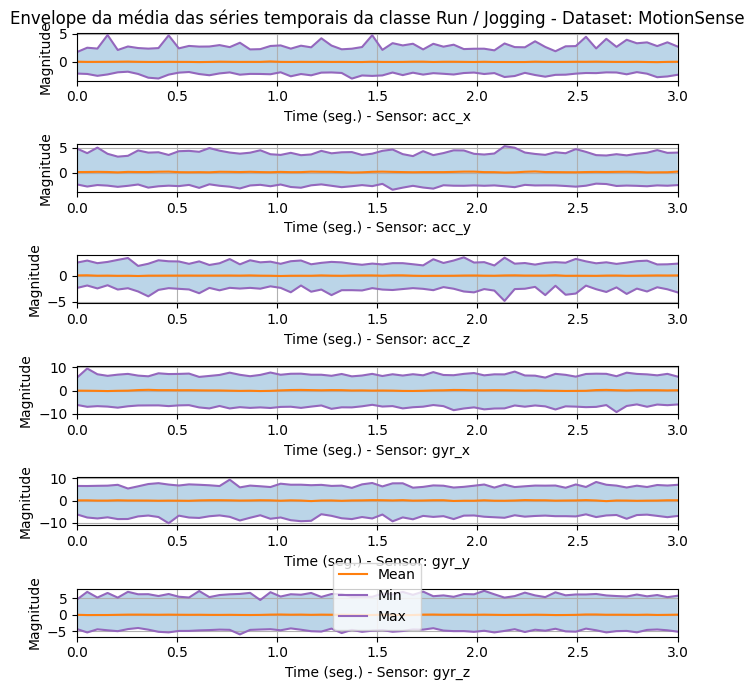

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


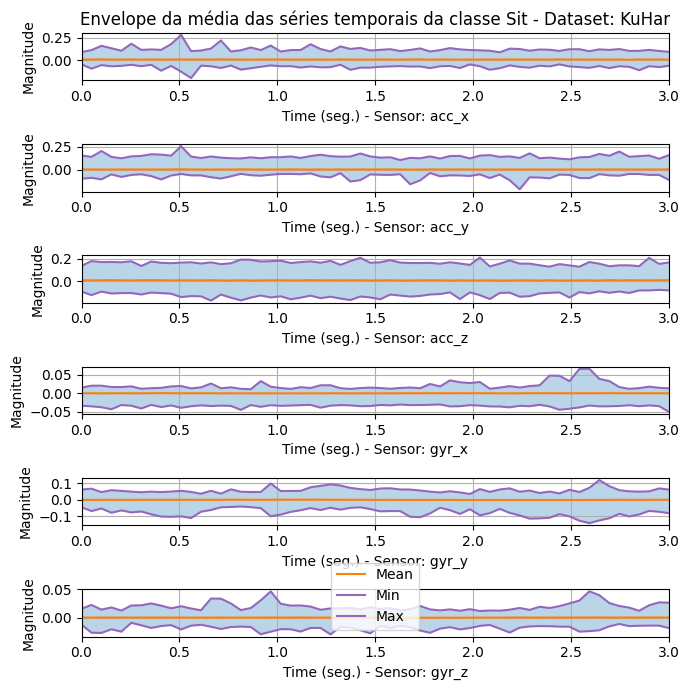

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


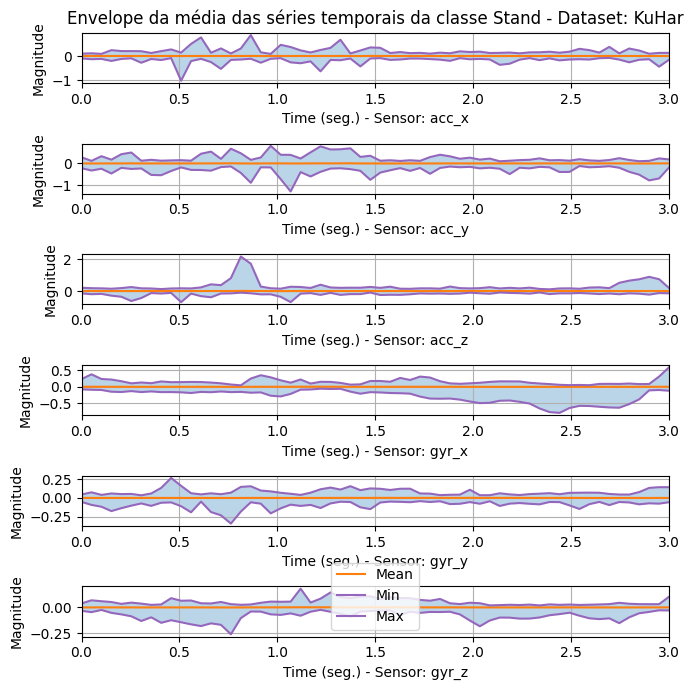

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


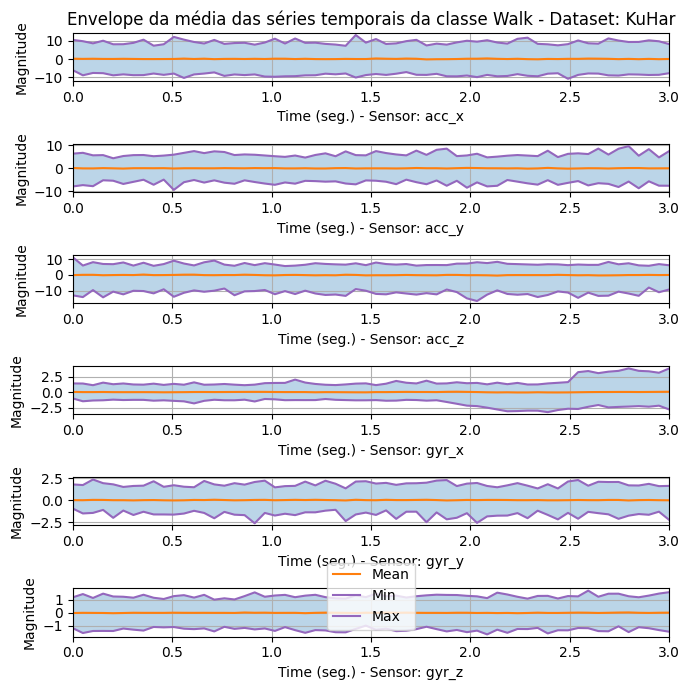

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


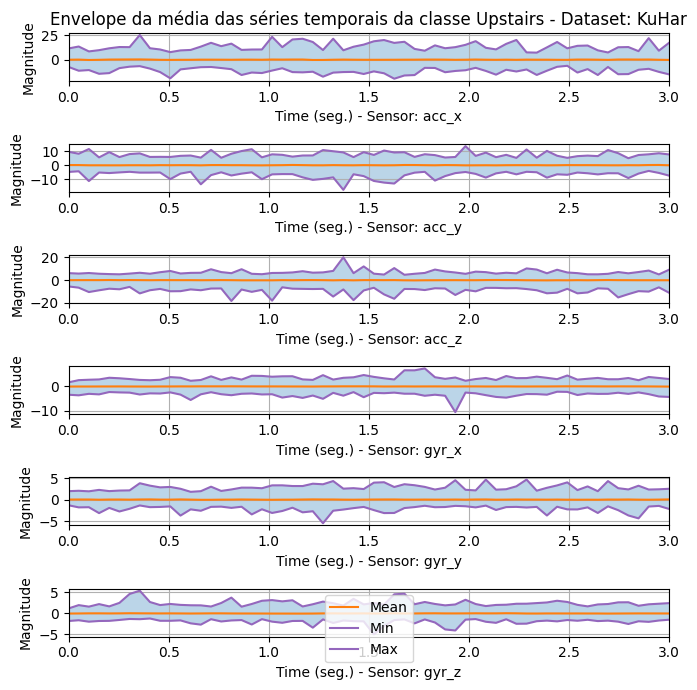

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


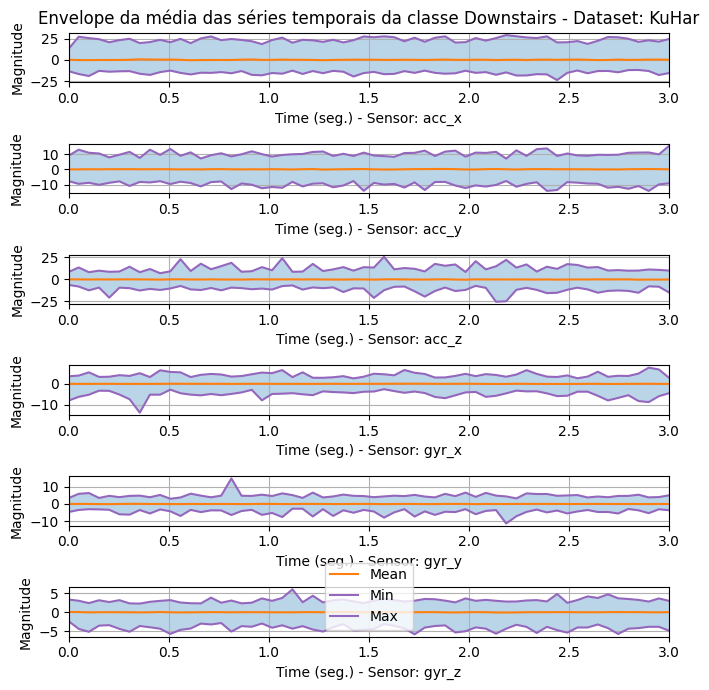

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


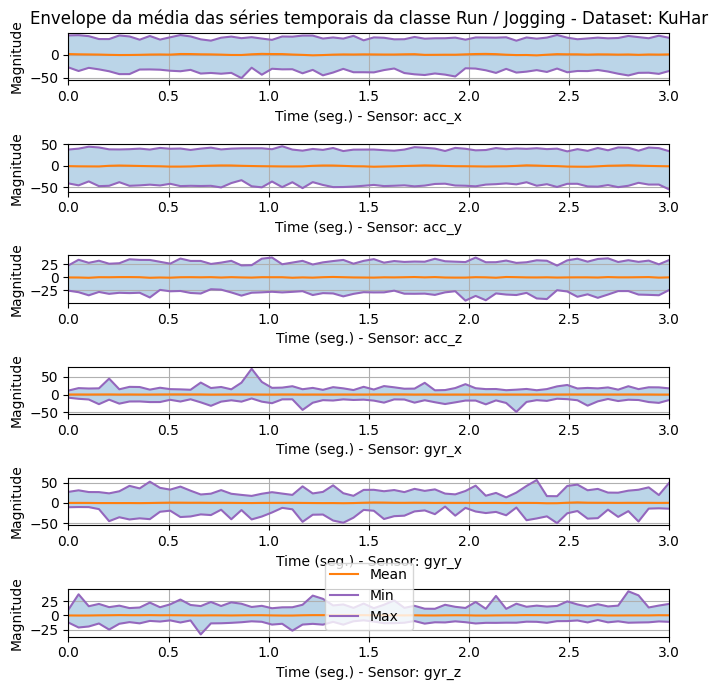

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


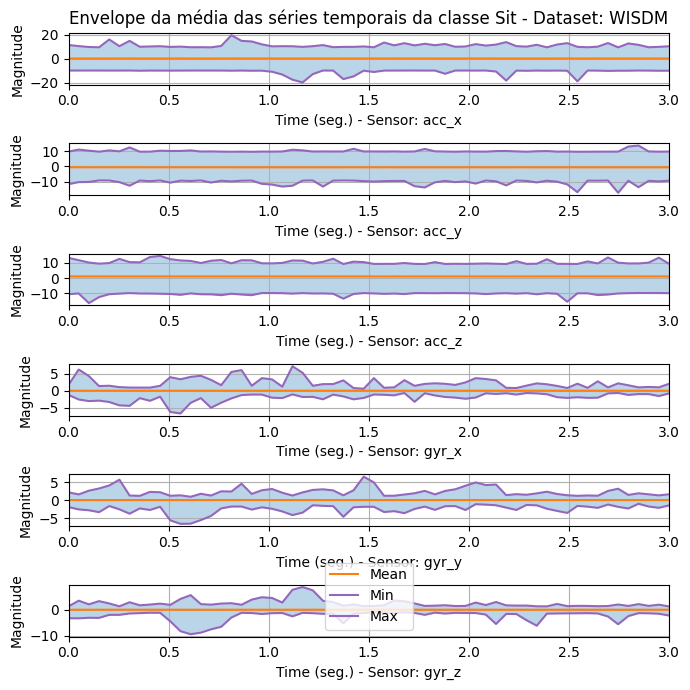

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


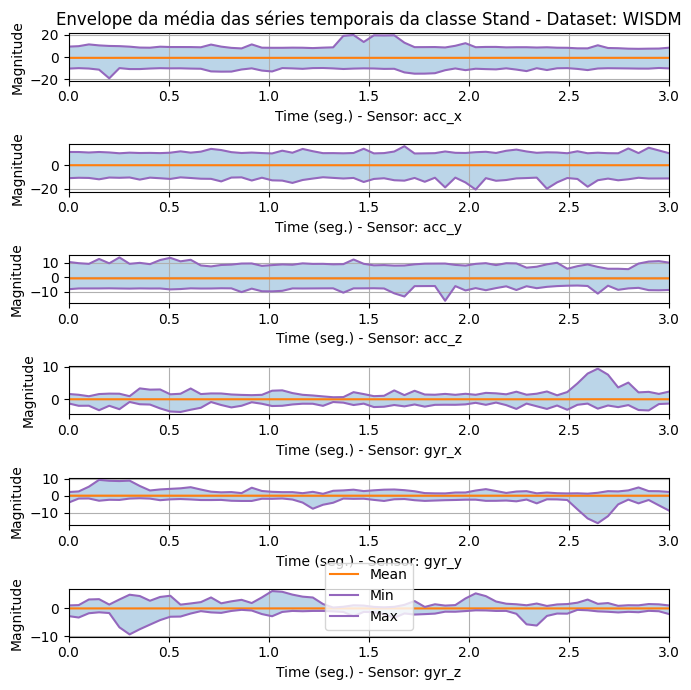

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


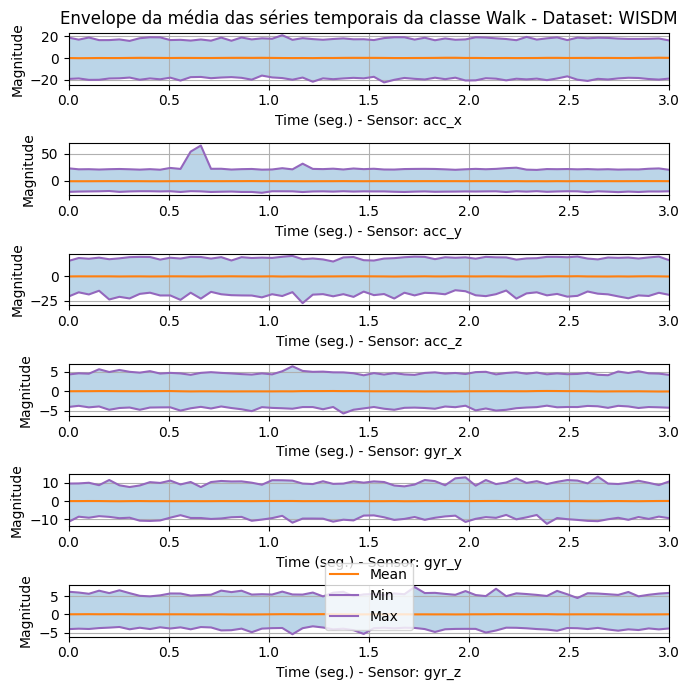

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


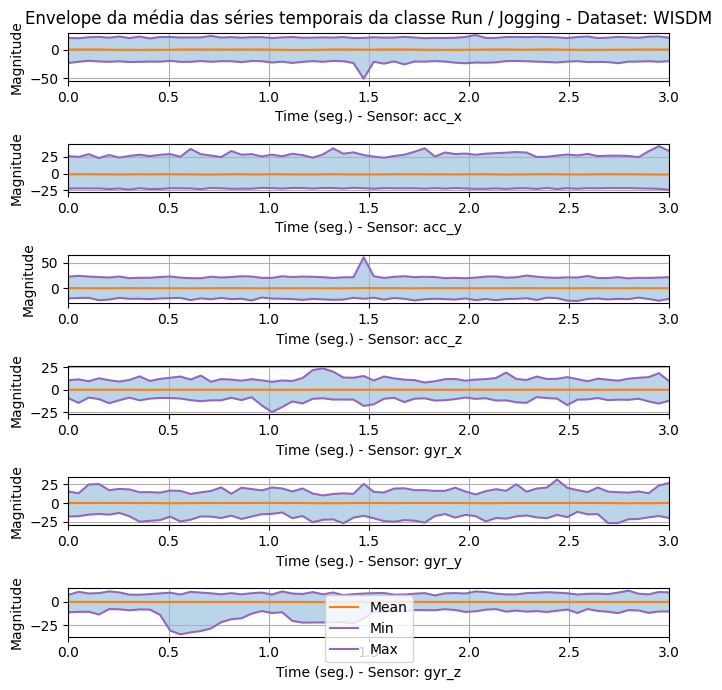

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


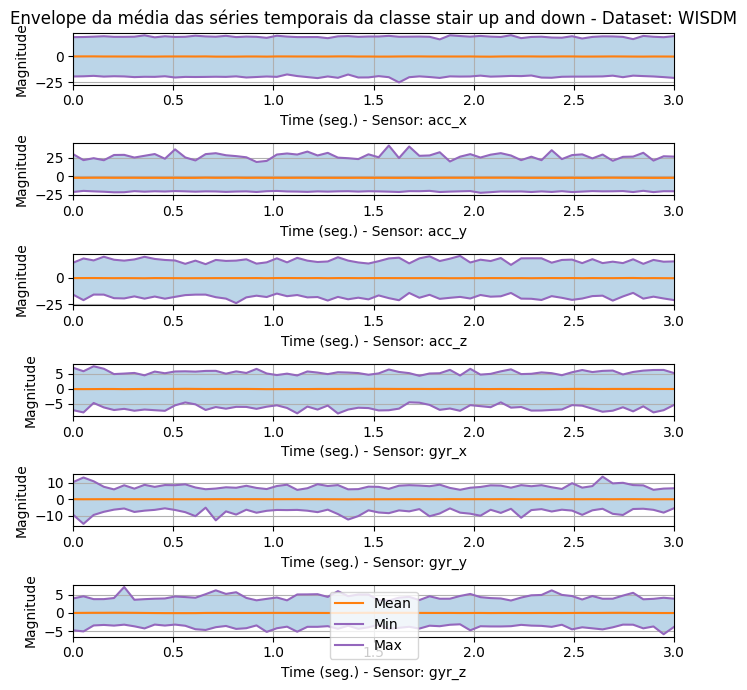

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


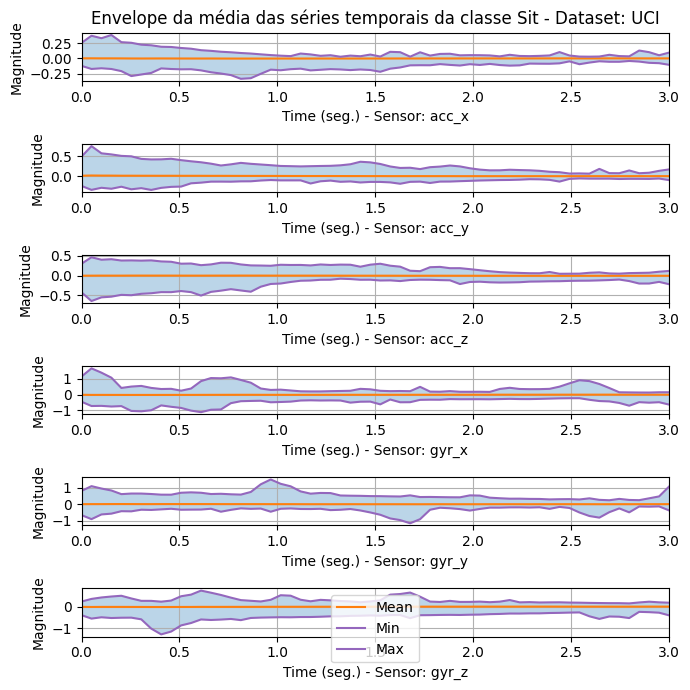

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


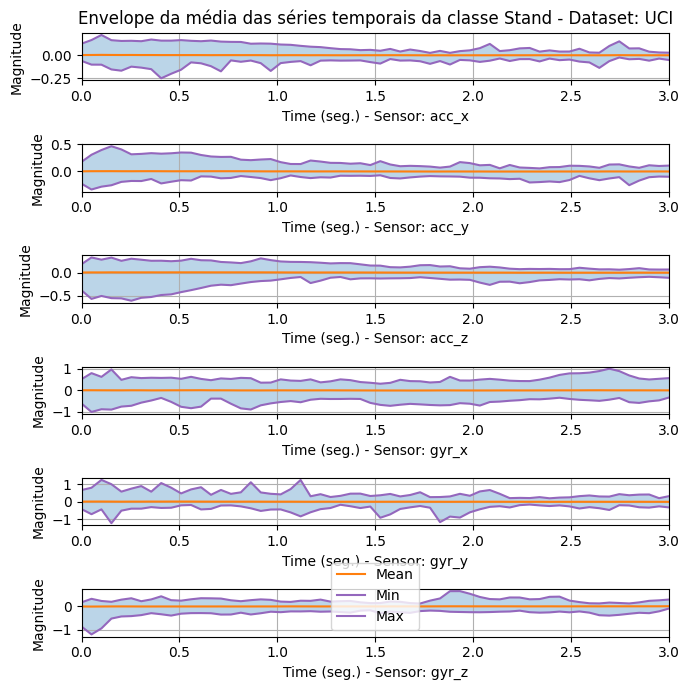

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


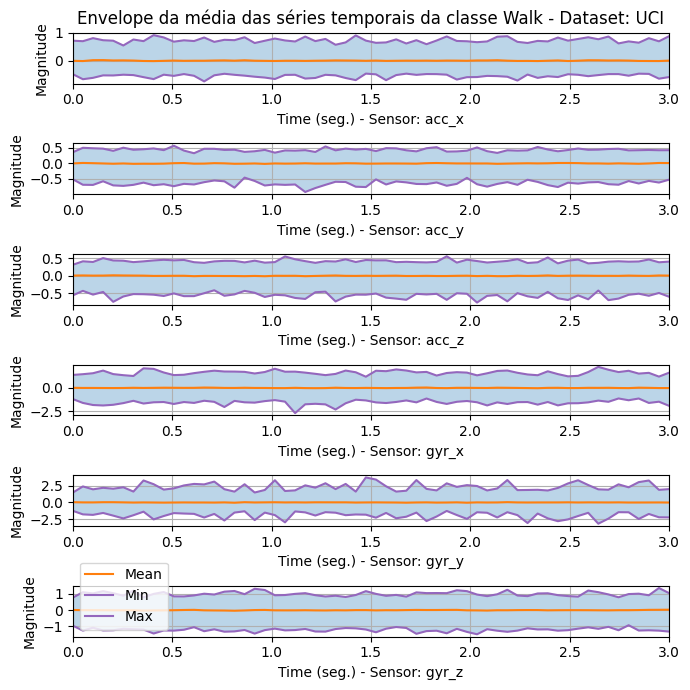

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


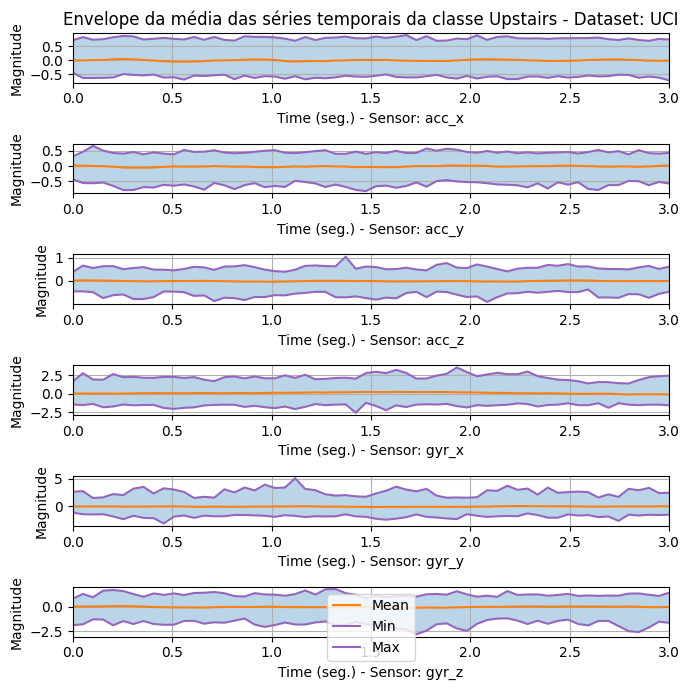

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


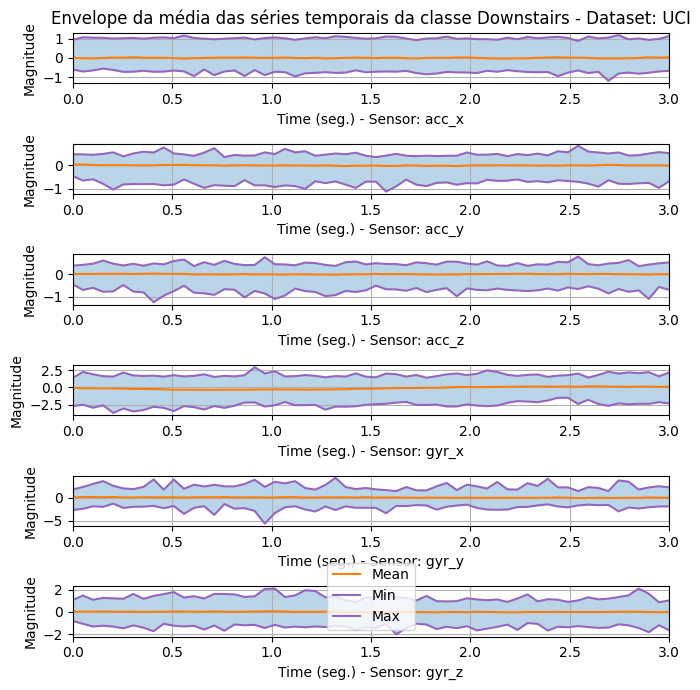

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


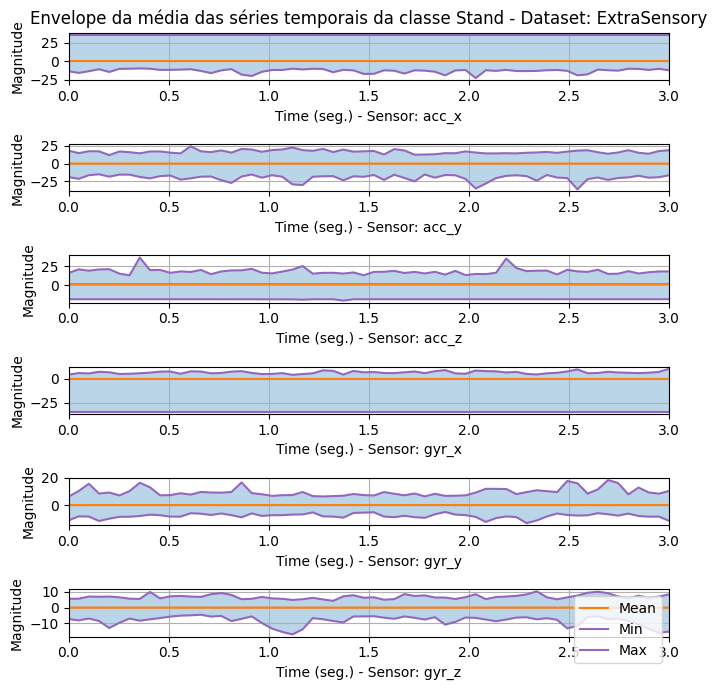

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


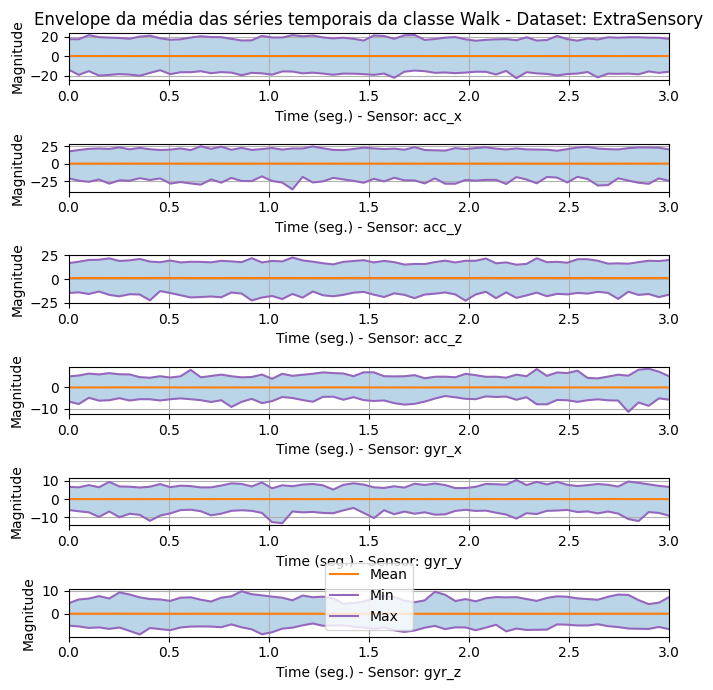

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


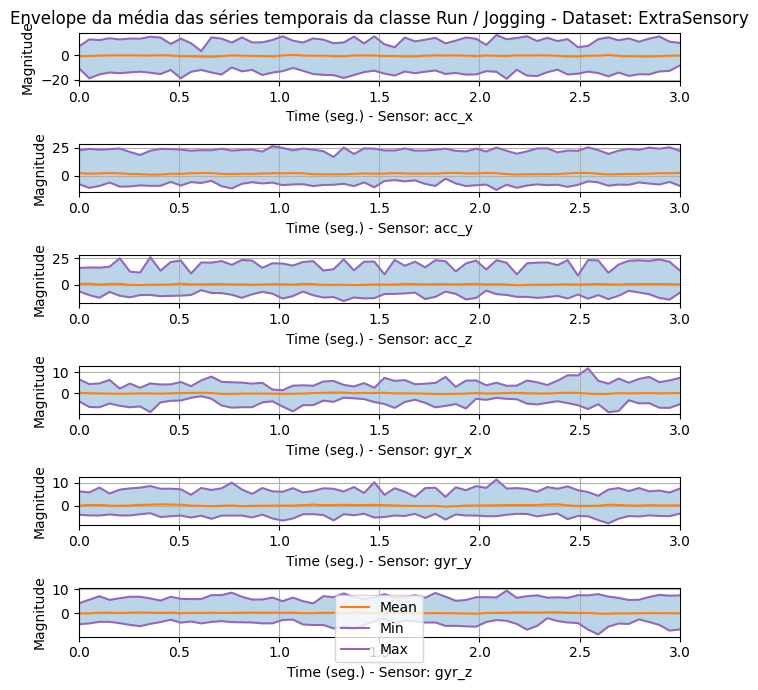

In [32]:
from librep.datasets.multimodal import ArrayMultiModalDataset

datasets = {'K': 'KuHar', 
            'M': 'MotionSense',
            'C': 'CHARM',
            'E': 'ExtraSensory', 
            'W': 'WISDM', 
            'U': 'UCI'
}

# Features to select
features = [
    "accel-x",
    "accel-y",
    "accel-z",
    "gyro-x",
    "gyro-y",
    "gyro-z"
]

for dataset in data["Id Dataset"].unique():

    data_new = data[data["Id Dataset"].isin([dataset])]

    # Creating the datasets
    data_new = PandasMultiModalDataset(
        data_new,
        feature_prefixes=features,
        label_columns='standard activity code',
        as_array=True
    )
    
    # Train
    train = ArrayMultiModalDataset(
        X=np.array(data_new.data.iloc[:,:-2]), y=np.array(data_new.data['standard activity code']),
        window_slices=data_new.window_slices,
        window_names=data_new.window_names,
    )
    plot_mean(train, dataset, classes_names, datasets)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


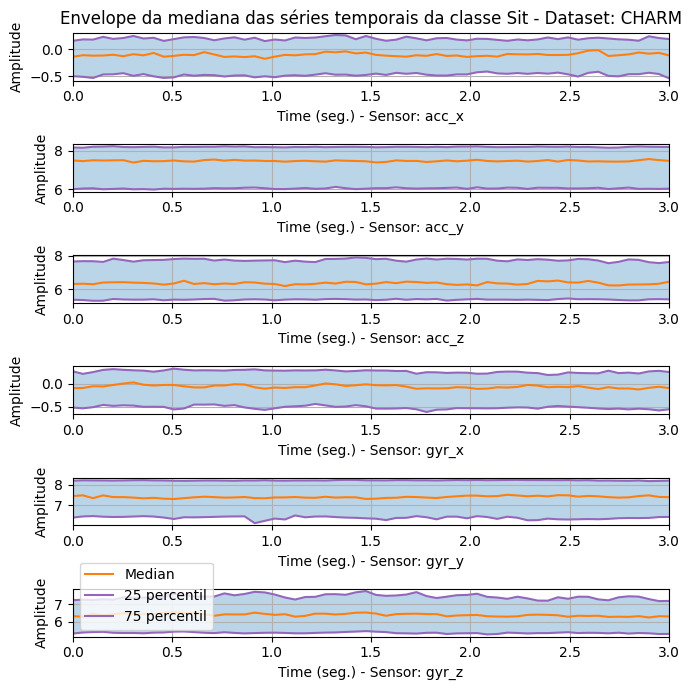

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


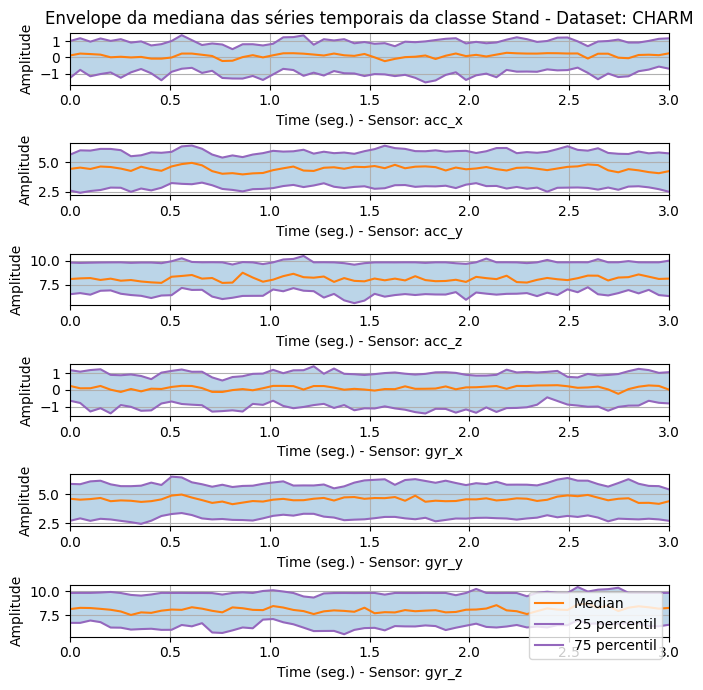

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


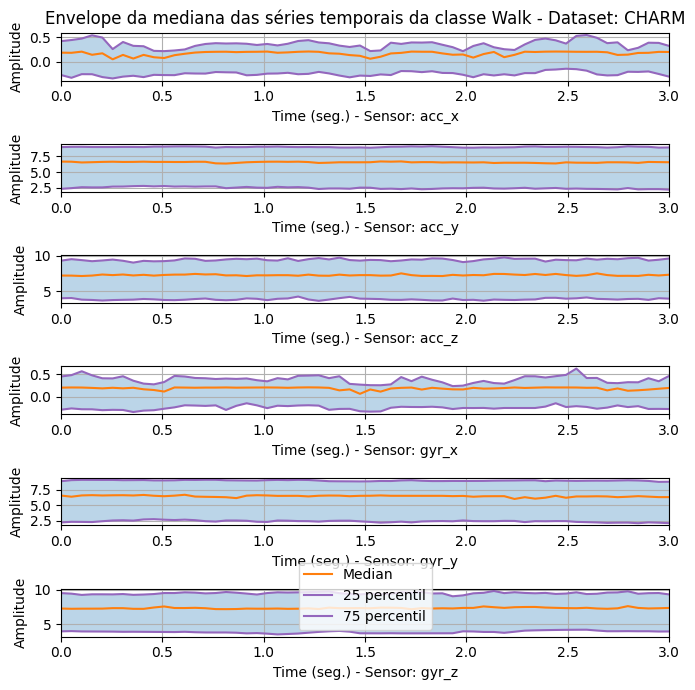

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


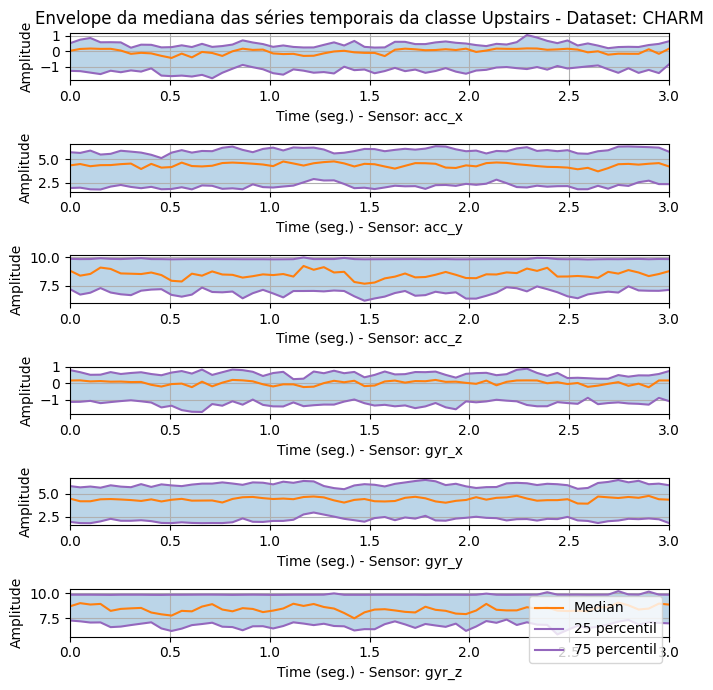

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


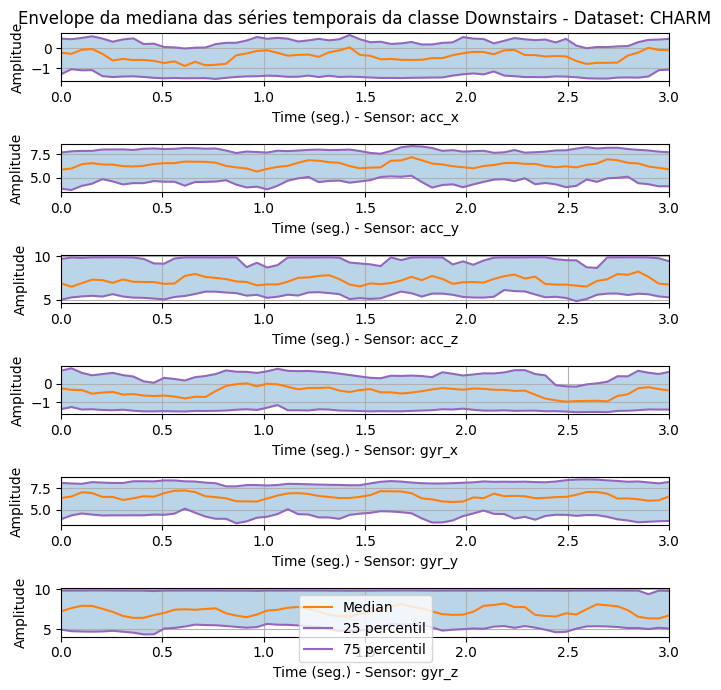

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


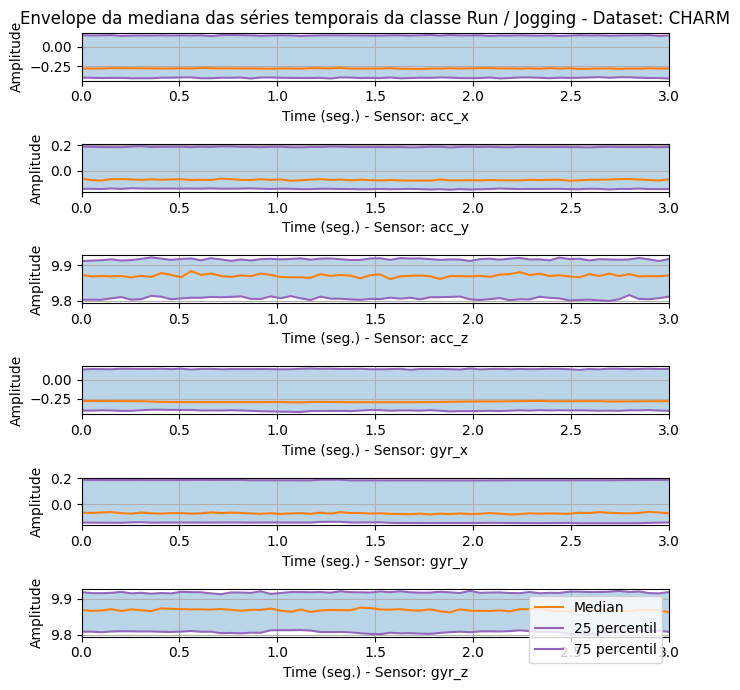

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


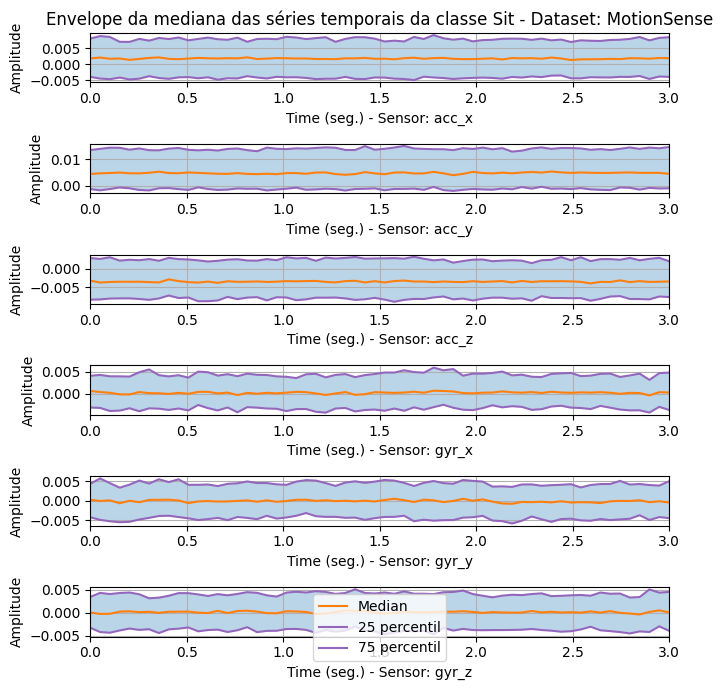

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


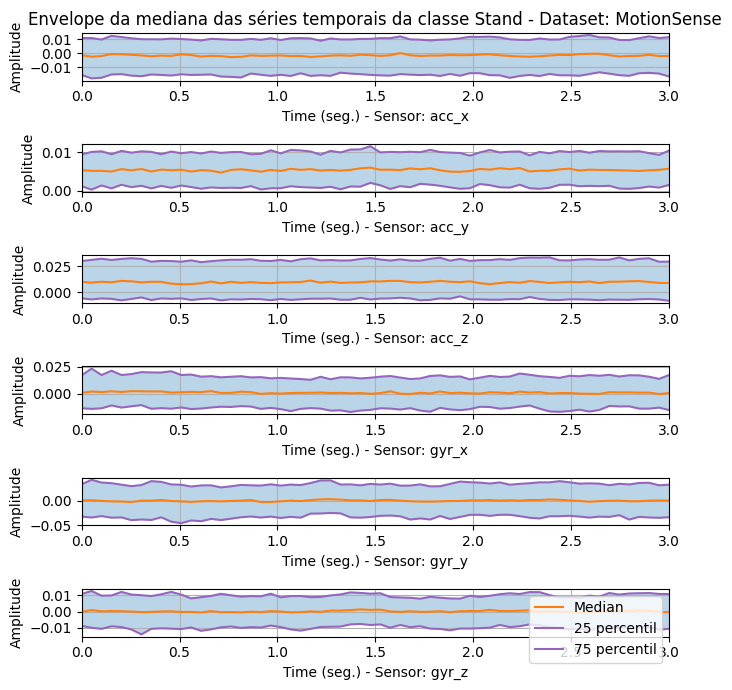

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


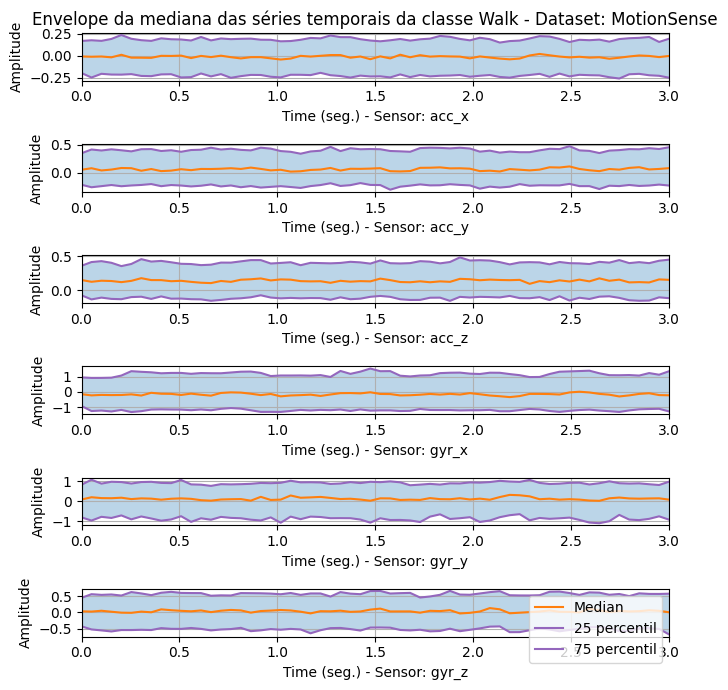

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


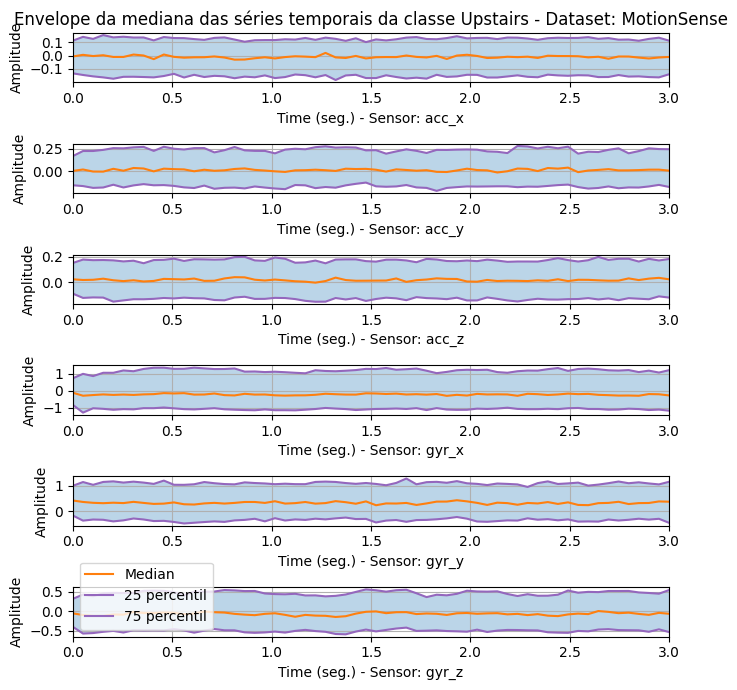

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


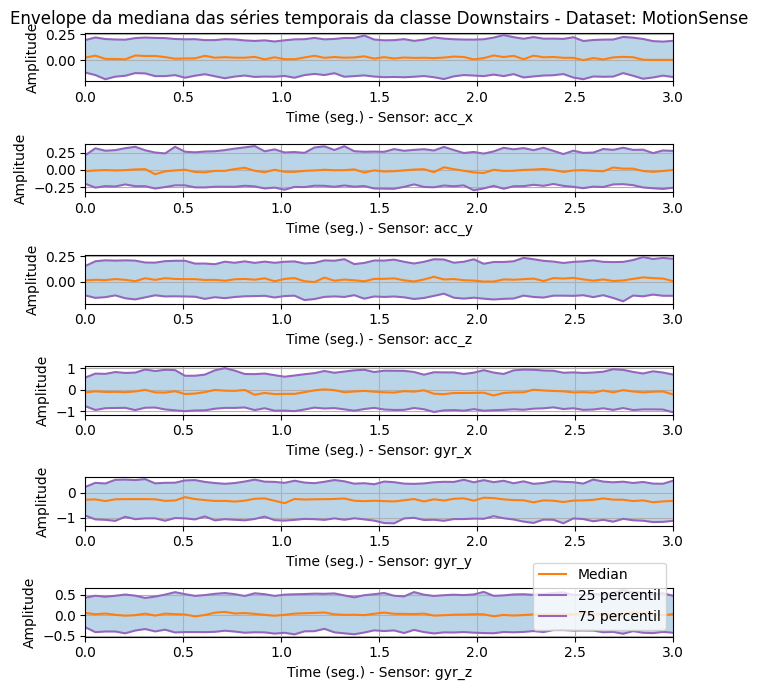

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


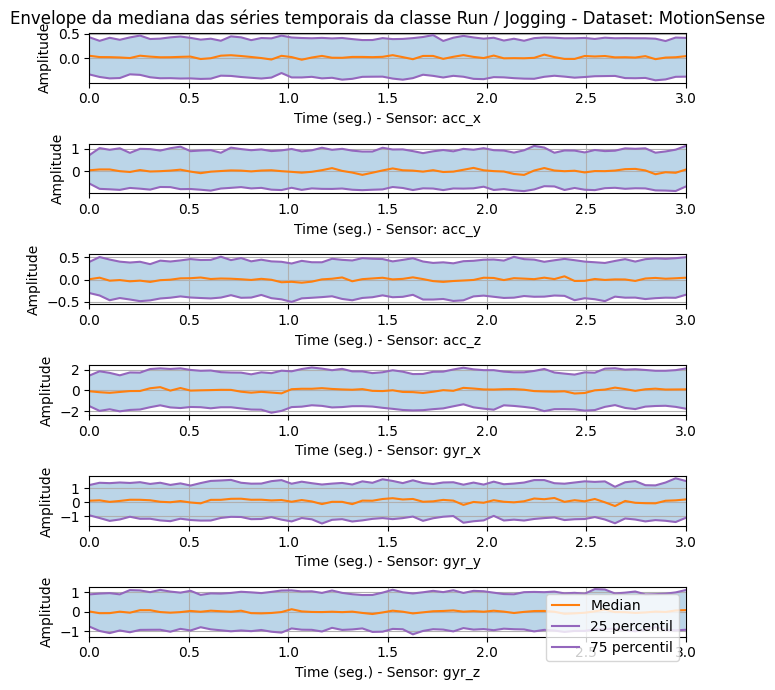

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


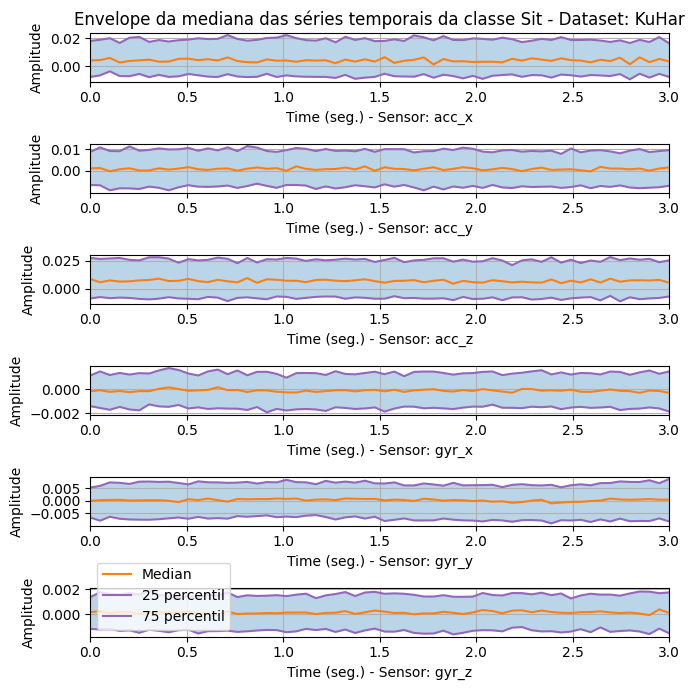

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


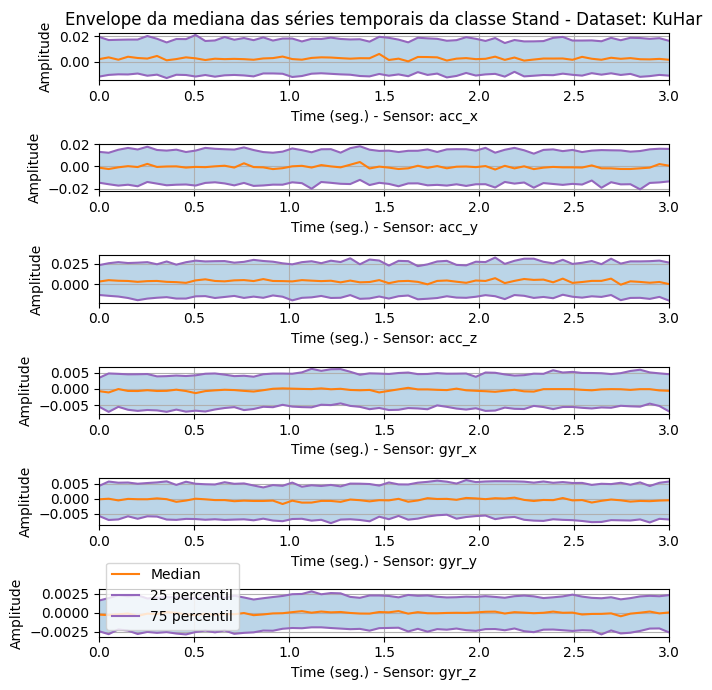

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


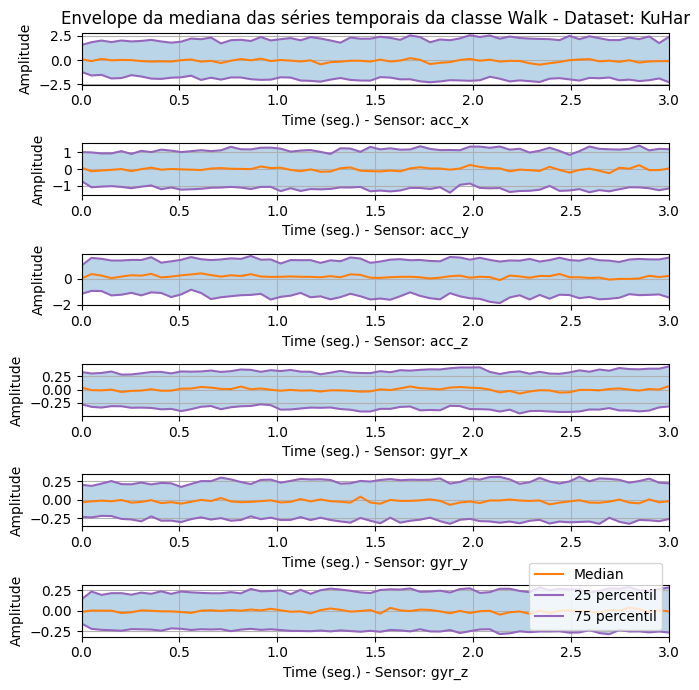

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


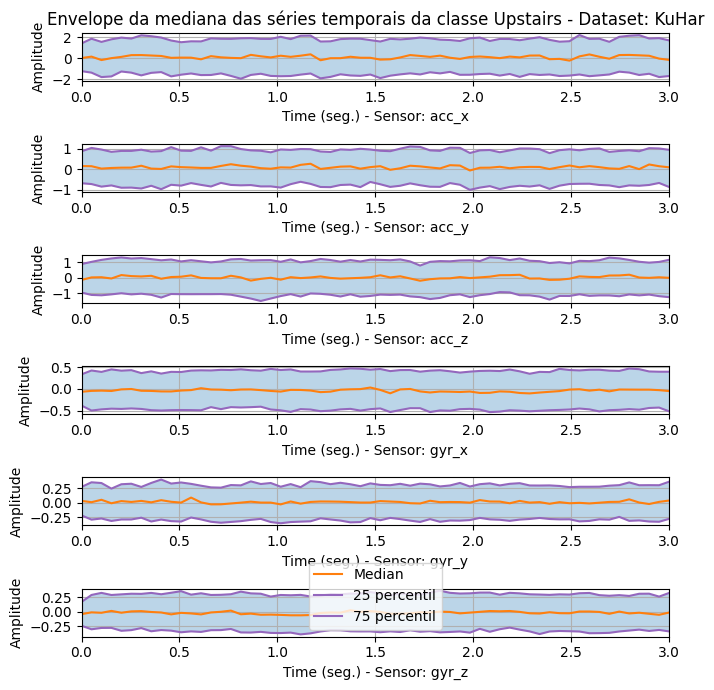

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


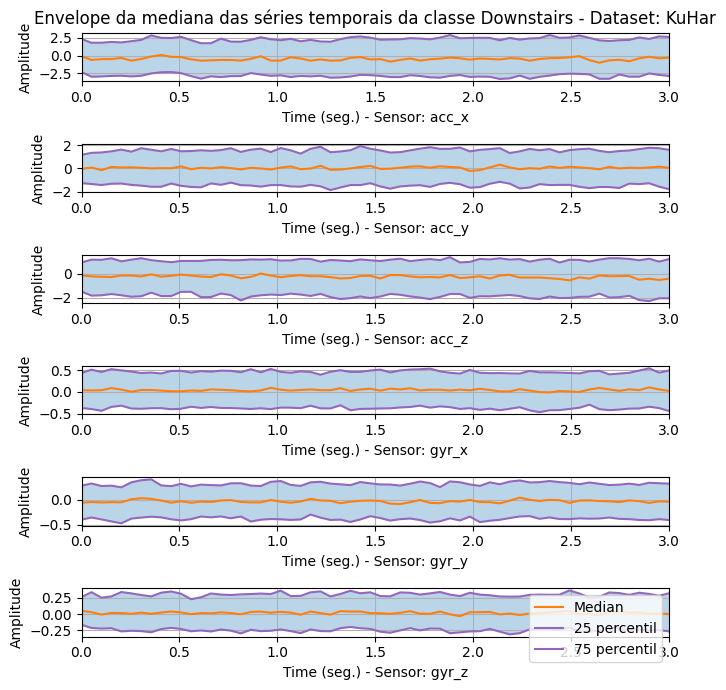

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


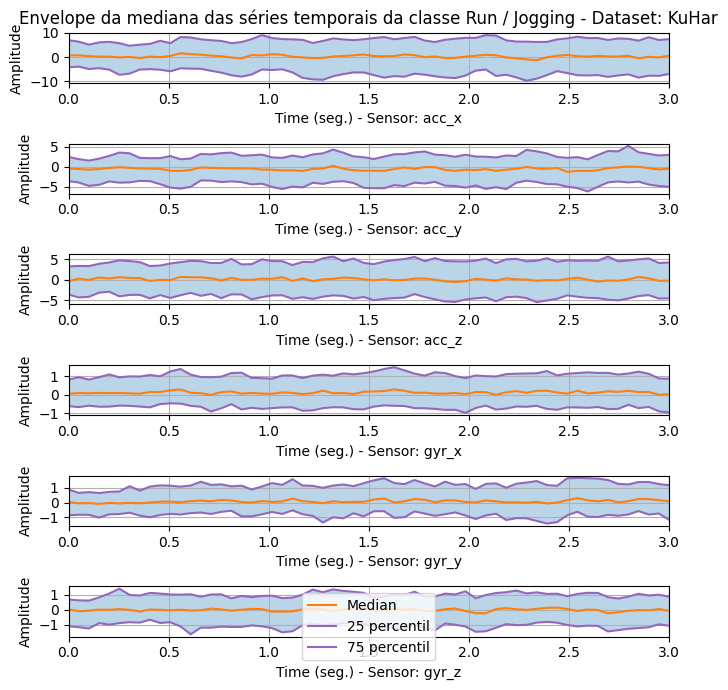

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


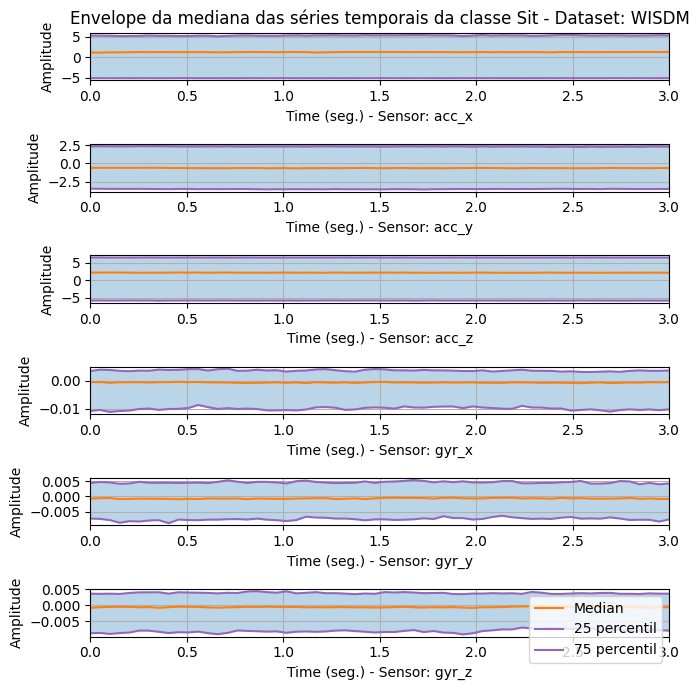

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


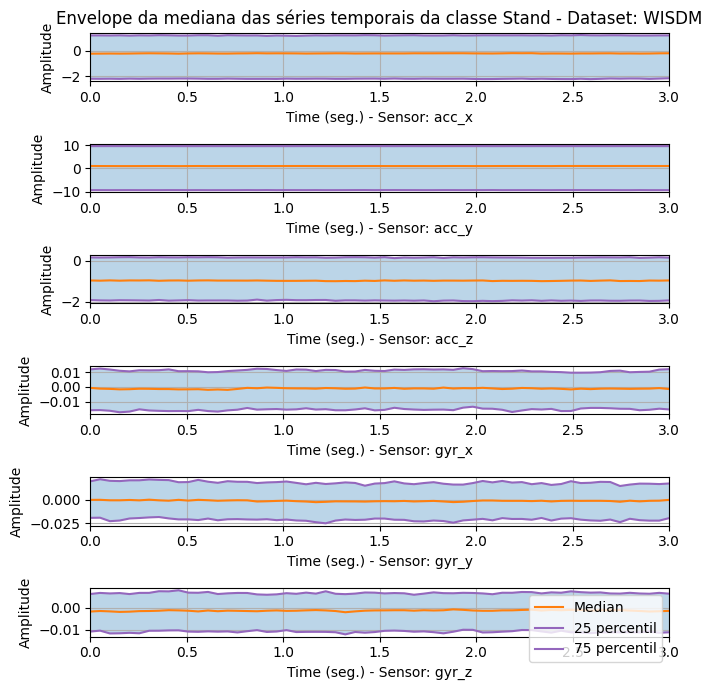

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


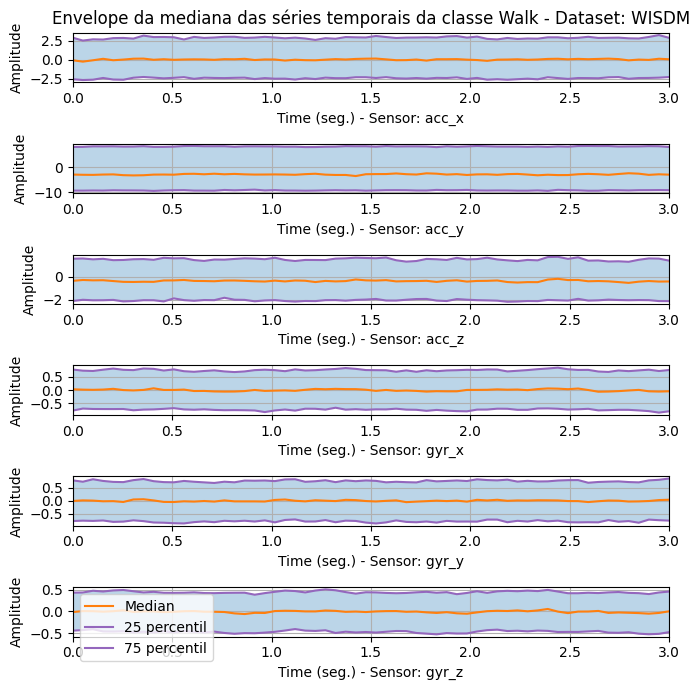

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


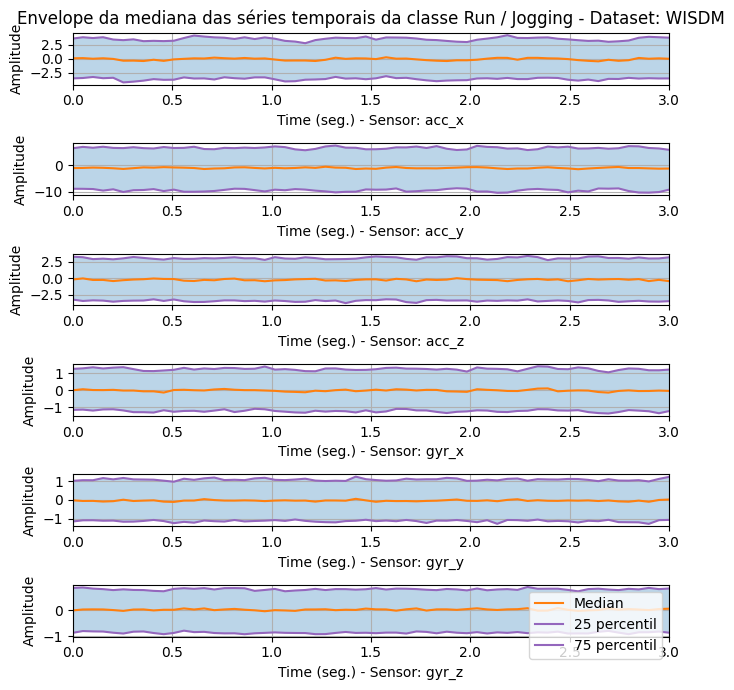

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


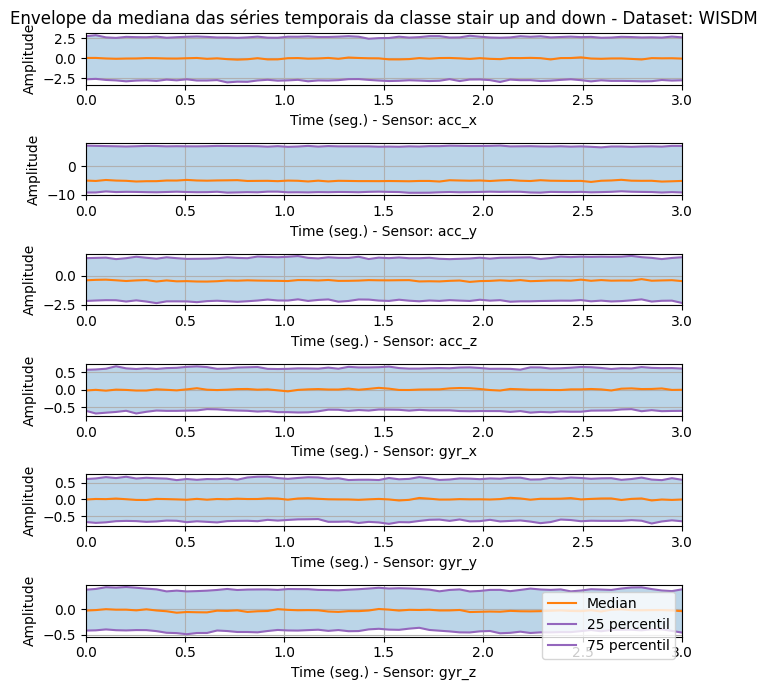

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


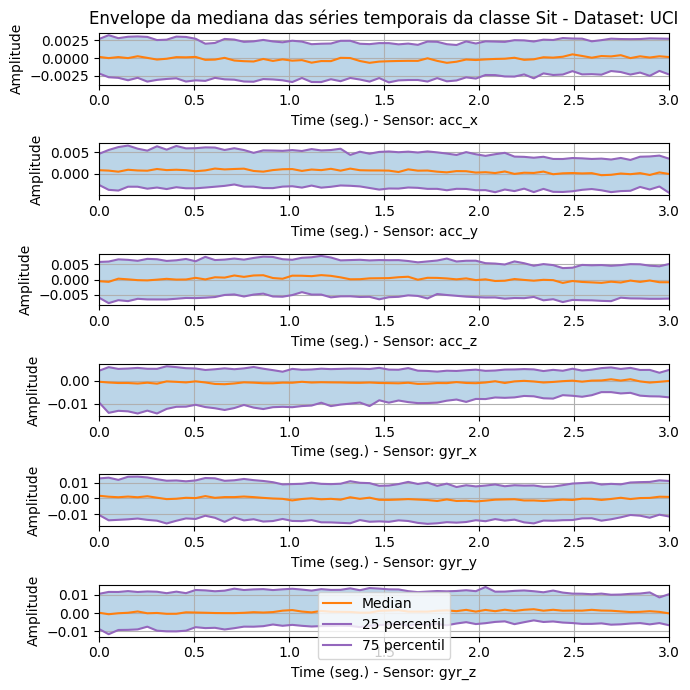

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


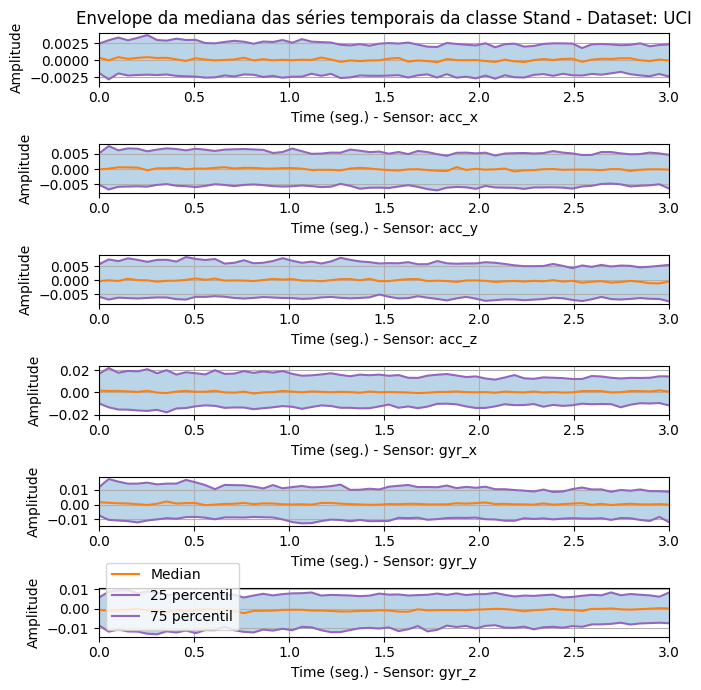

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


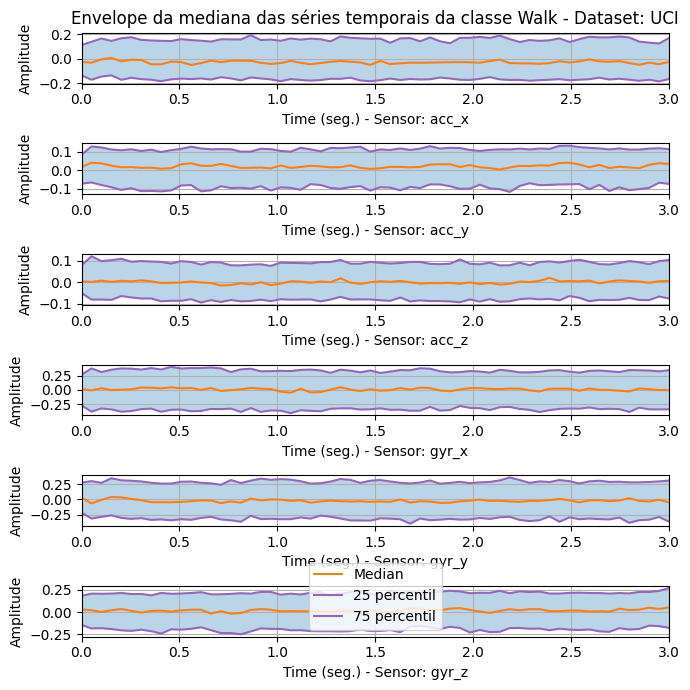

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


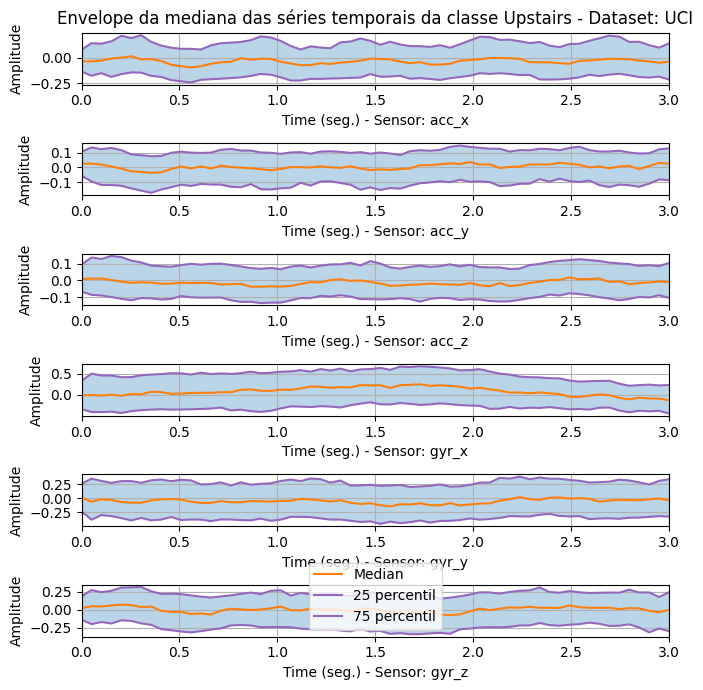

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


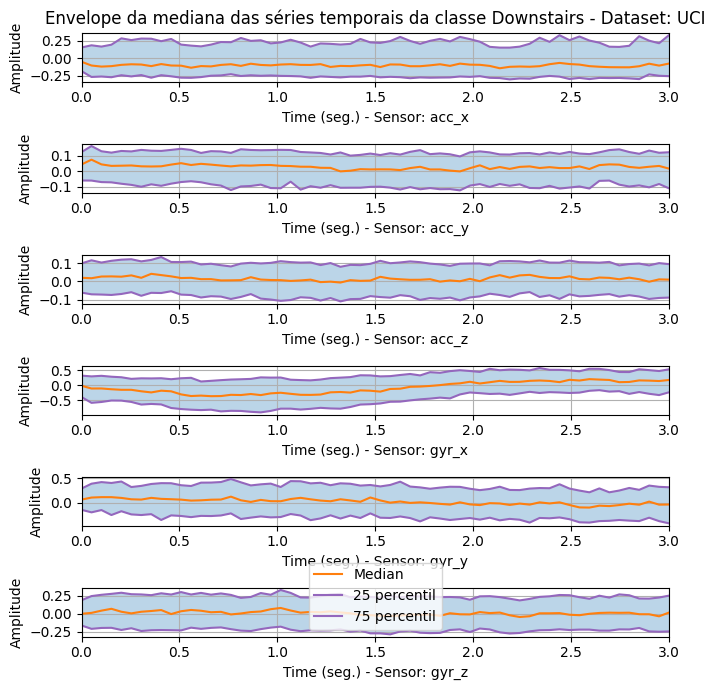

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


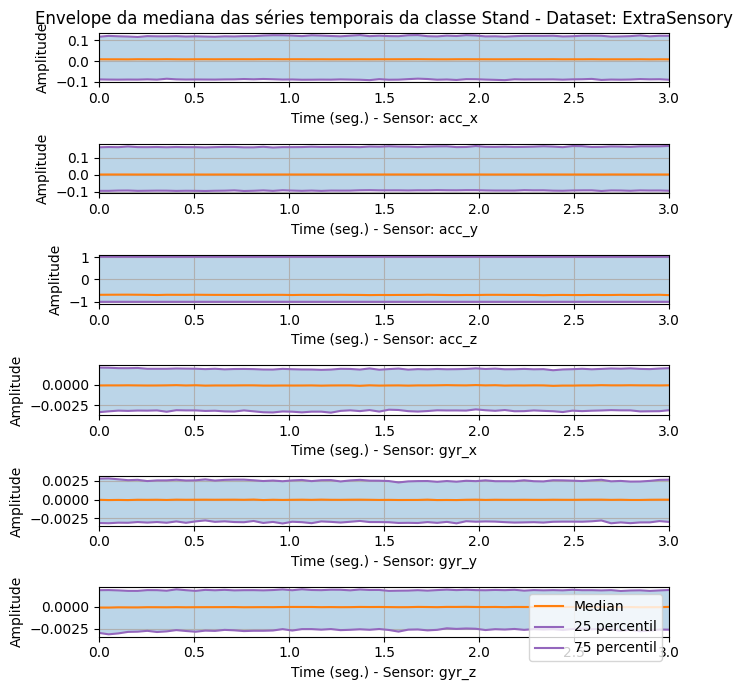

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


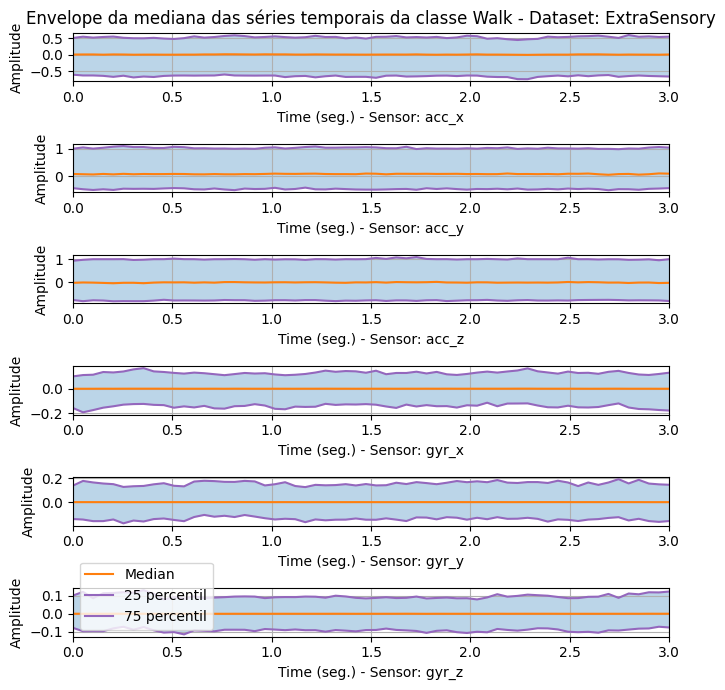

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


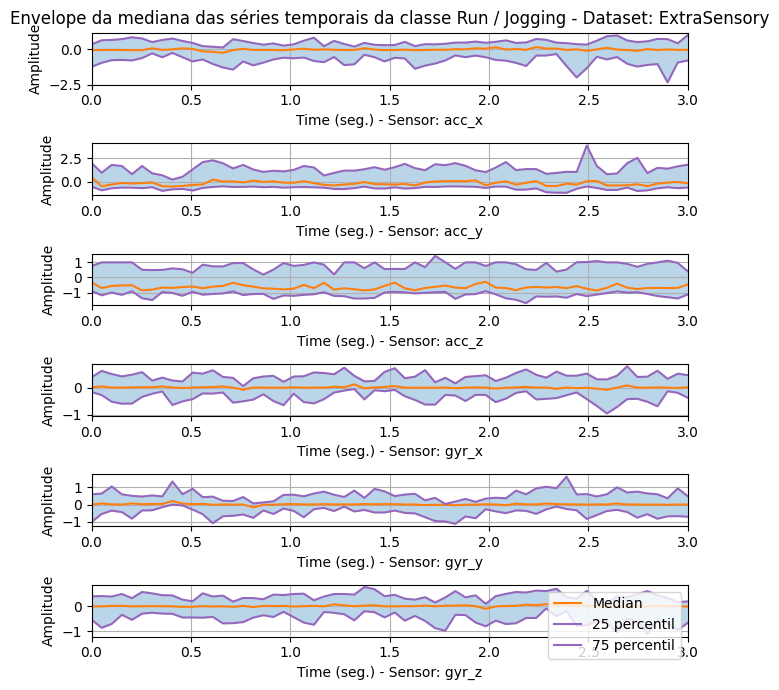

In [33]:
datasets = {'K': 'KuHar', 
            'M': 'MotionSense',
            'C': 'CHARM',
            'E': 'ExtraSensory', 
            'W': 'WISDM', 
            'U': 'UCI'
}

# Features to select
features = [
    "accel-x",
    "accel-y",
    "accel-z",
    "gyro-x",
    "gyro-y",
    "gyro-z"
]

for dataset in data["Id Dataset"].unique():

    data_new = data[data["Id Dataset"].isin([dataset])]

    # Creating the datasets
    data_new = PandasMultiModalDataset(
        data_new,
        feature_prefixes=features,
        label_columns='standard activity code',
        as_array=True
    )
    
    # Train
    train = ArrayMultiModalDataset(
        X=np.array(data_new.data.iloc[:,:-2]), y=np.array(data_new.data['standard activity code']),
        window_slices=data_new.window_slices,
        window_names=data_new.window_names,
    )
    plot_median(train, dataset, classes_names, datasets)